# PRUEBA DE DIFERENTES MODELOS YOLO PARA DETECCIÓN DE PRÓTESIS

### PABLO GASCÓ LLOPIS

### DESCARGA DE LIBRERÍAS

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 22.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 100.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 60.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 43.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling

### IMPORTACIÓN LIBRERÍAS

In [ ]:
from ultralytics import YOLO

import os

import zipfile
from google.colab import files

import matplotlib.pyplot as plt
import pandas as pd
import time
import cv2

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### IMPORTACIÓN DE DATOS

In [ ]:
uploaded = files.upload()

Saving dataset_protesis.zip to dataset_protesis.zip


In [ ]:
with zipfile.ZipFile("dataset_protesis.zip", 'r') as zip_ref:
    zip_ref.extractall("dataset_protesis")

In [ ]:
import shutil
import os

# Ruta actual
source_folder = "dataset_protesis/dataset_protesis"

# Ruta destino
target_folder = "dataset_protesis"

# Mover todo lo que hay dentro de dataset/dataset a dataset/
for item in os.listdir(source_folder):
    shutil.move(os.path.join(source_folder, item), target_folder)

# Eliminar la carpeta vacía
os.rmdir(source_folder)


## MODELO YOLOv8n


### ENTRENAMIENTO YOLOv8n

In [ ]:
yolo_v8n = YOLO("yolov8n.yaml")

yolo_v8n.train(
    data="dataset_protesis/data_protesis.yaml",
    epochs=70,
    imgsz=640,
    batch=16,
    project="comparativa_yolo",
    name="yolov8n",
    exist_ok=True
)


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_protesis/data_protesis.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8n, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, 

100%|██████████| 755k/755k [00:00<00:00, 14.6MB/s]

Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

YOLOv8n summary: 129 layers, 3,011,043 parameters, 3,011,027 gradients, 8.2 GFLOPs

Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


100%|██████████| 5.35M/5.35M [00:00<00:00, 66.1MB/s]


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2833.7±1887.9 MB/s, size: 326.8 KB)


train: Scanning /content/dataset_protesis/labels/train... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<00:00, 1043.32it/s]

train: New cache created: /content/dataset_protesis/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1563.1±1326.2 MB/s, size: 333.2 KB)


val: Scanning /content/dataset_protesis/labels/val... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<00:00, 771.58it/s]

val: New cache created: /content/dataset_protesis/labels/val.cache


Plotting labels to comparativa_yolo/yolov8n/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to comparativa_yolo/yolov8n
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      2.01G      3.073      4.454      4.249         26        640: 100%|██████████| 11/11 [00:06<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.03it/s]

                   all         50         50    0.00138        0.4    0.00124   0.000464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      2.25G      3.028      4.273      4.175         24        640: 100%|██████████| 11/11 [00:02<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         50         50    0.00143        0.4    0.00184   0.000553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      2.26G      2.991      3.936       4.09         28        640: 100%|██████████| 11/11 [00:02<00:00,  4.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.61it/s]

                   all         50         50    0.00142        0.4    0.00138   0.000517



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      2.28G      2.832      3.651      3.848         26        640: 100%|██████████| 11/11 [00:02<00:00,  3.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.76it/s]

                   all         50         50    0.00152       0.42    0.00199   0.000615



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70       2.3G      2.823       3.45      3.646         24        640: 100%|██████████| 11/11 [00:02<00:00,  4.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         50         50     0.0014        0.4    0.00193   0.000572



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      2.31G       2.84      3.411      3.452         25        640: 100%|██████████| 11/11 [00:02<00:00,  4.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         50         50    0.00134       0.38    0.00131   0.000422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      2.33G      2.745      3.188      3.321         36        640: 100%|██████████| 11/11 [00:03<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         50         50    0.00178       0.44    0.00303   0.000767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      2.35G      2.678      3.204      3.315         33        640: 100%|██████████| 11/11 [00:02<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

                   all         50         50    0.00221        0.4    0.00366    0.00123



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      2.37G      2.641      2.974      3.191         33        640: 100%|██████████| 11/11 [00:02<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]

                   all         50         50    0.00193       0.36    0.00248   0.000637



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      2.38G      2.628      2.714      3.144         27        640: 100%|██████████| 11/11 [00:03<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         50     0.0018       0.54     0.0024   0.000777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70       2.4G      2.555      2.589      3.071         32        640: 100%|██████████| 11/11 [00:02<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         50         50    0.00173       0.52    0.00314    0.00106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      2.42G      2.606      2.575      3.079         33        640: 100%|██████████| 11/11 [00:02<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         50         50    0.00326        0.6     0.0181    0.00372



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      2.44G      2.569      2.581      3.007         26        640: 100%|██████████| 11/11 [00:03<00:00,  2.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         50         50       0.17       0.06      0.054     0.0157



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      2.45G      2.523      2.454      2.977         28        640: 100%|██████████| 11/11 [00:02<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]

                   all         50         50      0.381       0.18      0.156     0.0446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      2.47G      2.558      2.329      3.018         34        640: 100%|██████████| 11/11 [00:02<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]

                   all         50         50     0.0951       0.06     0.0408     0.0129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      2.49G      2.536      2.298      2.942         35        640: 100%|██████████| 11/11 [00:03<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         50         50     0.0843       0.16     0.0404     0.0115



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70       2.5G      2.601      2.196      2.981         36        640: 100%|██████████| 11/11 [00:02<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]

                   all         50         50      0.246       0.28      0.149     0.0449



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      2.52G      2.512       2.11      2.962         35        640: 100%|██████████| 11/11 [00:02<00:00,  4.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         50         50    0.00514        0.6     0.0103     0.0031



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      2.54G      2.434      2.022       2.89         31        640: 100%|██████████| 11/11 [00:02<00:00,  4.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]

                   all         50         50      0.585       0.52      0.557      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      2.55G      2.266      1.976      2.775         28        640: 100%|██████████| 11/11 [00:02<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.41it/s]

                   all         50         50      0.493       0.52      0.518      0.198



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      2.57G      2.142      1.858      2.649         25        640: 100%|██████████| 11/11 [00:02<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         50         50      0.216        0.5      0.202     0.0904



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      2.59G      2.172      1.823      2.672         36        640: 100%|██████████| 11/11 [00:02<00:00,  4.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.05it/s]

                   all         50         50      0.646       0.68        0.7      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70       2.6G      2.325      1.961      2.743         27        640: 100%|██████████| 11/11 [00:03<00:00,  3.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]

                   all         50         50      0.597      0.622      0.669      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      2.62G      2.135      1.788      2.643         34        640: 100%|██████████| 11/11 [00:02<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         50         50        0.7       0.58      0.656      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      2.64G      2.146      1.756      2.606         29        640: 100%|██████████| 11/11 [00:02<00:00,  4.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.99it/s]

                   all         50         50        0.8       0.74      0.782      0.353



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      2.66G      2.125      1.729      2.597         33        640: 100%|██████████| 11/11 [00:03<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.69it/s]

                   all         50         50      0.873        0.6      0.758      0.301



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      2.67G      1.994      1.672      2.476         26        640: 100%|██████████| 11/11 [00:02<00:00,  4.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         50         50     0.0732       0.36     0.0553     0.0155



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      2.69G      2.113      1.647      2.548         24        640: 100%|██████████| 11/11 [00:02<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.52it/s]


                   all         50         50      0.429      0.541      0.402      0.131

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      2.71G       2.09       1.61      2.515         31        640: 100%|██████████| 11/11 [00:03<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         50         50      0.734       0.68      0.711        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      2.72G      2.009      1.667      2.454         32        640: 100%|██████████| 11/11 [00:02<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         50         50      0.715      0.701      0.787      0.324



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      2.74G      1.972      1.591      2.415         29        640: 100%|██████████| 11/11 [00:02<00:00,  4.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]

                   all         50         50      0.763       0.78      0.835      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      2.76G      1.904      1.473      2.346         39        640: 100%|██████████| 11/11 [00:03<00:00,  3.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         50         50      0.773        0.8      0.752       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      2.78G      2.021      1.623      2.487         27        640: 100%|██████████| 11/11 [00:02<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         50         50       0.69      0.801      0.827      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      2.79G      2.022      1.512      2.434         34        640: 100%|██████████| 11/11 [00:02<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         50         50      0.633       0.76      0.795      0.332



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      2.81G      1.892      1.457      2.357         23        640: 100%|██████████| 11/11 [00:03<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.79it/s]

                   all         50         50      0.815       0.84      0.859      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      2.83G        1.8      1.462      2.291         23        640: 100%|██████████| 11/11 [00:02<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.55it/s]

                   all         50         50      0.733      0.822      0.848      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      2.85G      1.847      1.398      2.293         29        640: 100%|██████████| 11/11 [00:02<00:00,  4.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50         50      0.773       0.68      0.759      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      2.86G      1.917      1.452      2.323         26        640: 100%|██████████| 11/11 [00:02<00:00,  4.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.74it/s]

                   all         50         50      0.813       0.92      0.907      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      2.88G      1.798      1.324      2.267         33        640: 100%|██████████| 11/11 [00:02<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.65it/s]

                   all         50         50      0.774       0.78      0.851      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      2.89G       1.81      1.297      2.267         32        640: 100%|██████████| 11/11 [00:02<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         50         50      0.807      0.837      0.861      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      2.91G      1.803      1.351      2.291         28        640: 100%|██████████| 11/11 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]

                   all         50         50      0.821      0.823      0.882      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      2.93G      1.871      1.376       2.31         25        640: 100%|██████████| 11/11 [00:03<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         50         50      0.875      0.837      0.911      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      2.95G      1.706      1.266      2.192         34        640: 100%|██████████| 11/11 [00:02<00:00,  4.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50         50      0.953       0.82      0.946      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      2.96G      1.698      1.311       2.22         26        640: 100%|██████████| 11/11 [00:02<00:00,  4.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         50         50      0.919      0.903      0.961      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      2.98G      1.732      1.255      2.196         21        640: 100%|██████████| 11/11 [00:03<00:00,  3.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.52it/s]

                   all         50         50      0.804        0.9      0.931      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70         3G      1.774      1.267      2.215         28        640: 100%|██████████| 11/11 [00:02<00:00,  4.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         50         50      0.715       0.86      0.872      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      3.01G      1.704      1.234      2.179         36        640: 100%|██████████| 11/11 [00:02<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]

                   all         50         50       0.82      0.911      0.907      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      3.03G      1.703      1.233      2.159         24        640: 100%|██████████| 11/11 [00:03<00:00,  3.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.83it/s]

                   all         50         50      0.832      0.793      0.894      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      3.05G      1.671      1.258      2.177         34        640: 100%|██████████| 11/11 [00:02<00:00,  4.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.97it/s]

                   all         50         50      0.906      0.771       0.93      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      3.07G      1.647      1.239      2.153         30        640: 100%|██████████| 11/11 [00:02<00:00,  4.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.93it/s]

                   all         50         50      0.909       0.94       0.95      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      3.08G        1.7      1.205      2.154         30        640: 100%|██████████| 11/11 [00:03<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]

                   all         50         50      0.937      0.898       0.96      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70       3.1G      1.674      1.212      2.155         24        640: 100%|██████████| 11/11 [00:02<00:00,  4.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         50         50      0.889      0.964      0.976      0.526



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      3.12G      1.674      1.244      2.127         35        640: 100%|██████████| 11/11 [00:02<00:00,  4.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         50         50        0.9       0.86      0.947      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      3.13G      1.602      1.145      2.098         28        640: 100%|██████████| 11/11 [00:02<00:00,  3.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.79it/s]

                   all         50         50       0.94      0.943      0.976      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      3.15G      1.615      1.129       2.06         36        640: 100%|██████████| 11/11 [00:02<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.80it/s]

                   all         50         50      0.979       0.95       0.99      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      3.17G      1.571      1.098      2.039         32        640: 100%|██████████| 11/11 [00:02<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.72it/s]

                   all         50         50      0.916       0.94      0.952      0.515



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      3.19G      1.534       1.13      2.023         23        640: 100%|██████████| 11/11 [00:02<00:00,  4.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         50         50      0.935       0.96      0.986      0.563



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70       3.2G      1.599       1.12      2.083         30        640: 100%|██████████| 11/11 [00:03<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         50         50      0.939       0.98      0.987      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      3.22G      1.589      1.127      2.047         23        640: 100%|██████████| 11/11 [00:02<00:00,  4.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         50         50       0.96      0.955      0.987      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      3.24G      1.585        1.1      2.077         25        640: 100%|██████████| 11/11 [00:02<00:00,  4.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         50         50      0.939       0.92      0.979      0.527


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      3.26G      1.331      1.231      1.867         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.78it/s]

                   all         50         50      0.945        0.9      0.978      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      3.27G      1.388      1.141      1.891         15        640: 100%|██████████| 11/11 [00:02<00:00,  4.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         50         50      0.843      0.967       0.97      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      3.29G      1.381      1.054       1.91         15        640: 100%|██████████| 11/11 [00:02<00:00,  4.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.03it/s]

                   all         50         50      0.897       0.98      0.983      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      3.31G      1.344     0.9694      1.848         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         50         50      0.922      0.942      0.982      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      3.32G      1.343     0.9861      1.859         15        640: 100%|██████████| 11/11 [00:02<00:00,  4.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         50         50      0.902       0.94      0.977      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      3.34G      1.353     0.9979      1.843         15        640: 100%|██████████| 11/11 [00:02<00:00,  4.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         50         50      0.907        0.9      0.967      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      3.36G      1.356     0.9892      1.843         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]

                   all         50         50      0.946        0.9      0.966       0.54



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      3.38G      1.317     0.9331       1.83         15        640: 100%|██████████| 11/11 [00:02<00:00,  4.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         50         50      0.957      0.884      0.972      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      3.39G      1.269     0.9213      1.761         15        640: 100%|██████████| 11/11 [00:02<00:00,  4.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.64it/s]

                   all         50         50      0.978      0.891      0.975      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      3.41G      1.302     0.9056      1.786         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]

                   all         50         50      0.959      0.935      0.979      0.561



70 epochs completed in 0.082 hours.
Optimizer stripped from comparativa_yolo/yolov8n/weights/last.pt, 6.2MB
Optimizer stripped from comparativa_yolo/yolov8n/weights/best.pt, 6.2MB

Validating comparativa_yolo/yolov8n/weights/best.pt...
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.86it/s]


                   all         50         50      0.935       0.96      0.986      0.566
Speed: 0.3ms preprocess, 2.6ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to comparativa_yolo/yolov8n


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f93cd82290>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### GRAFICAR MÉTRICAS YOLOv8n

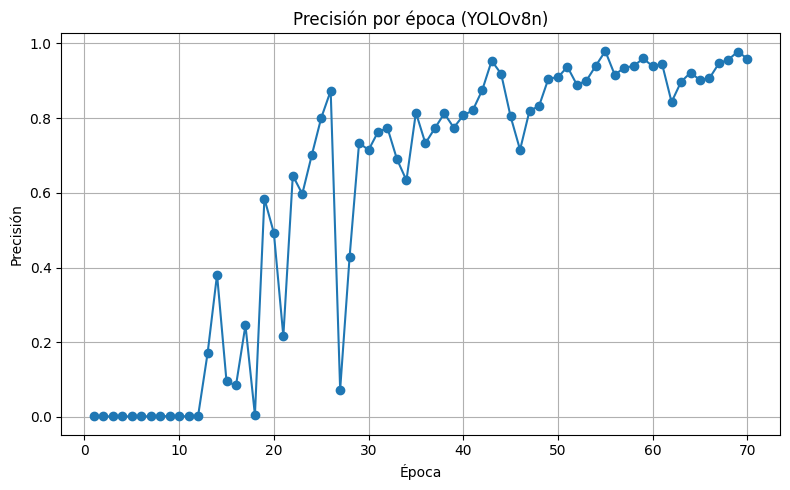

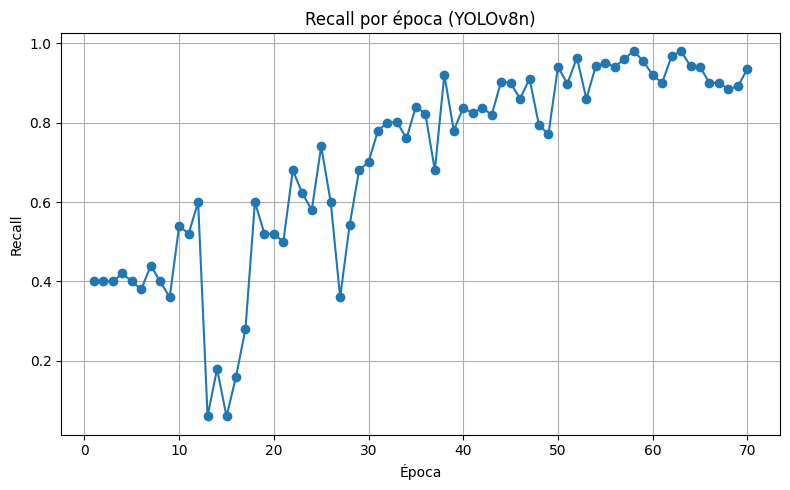

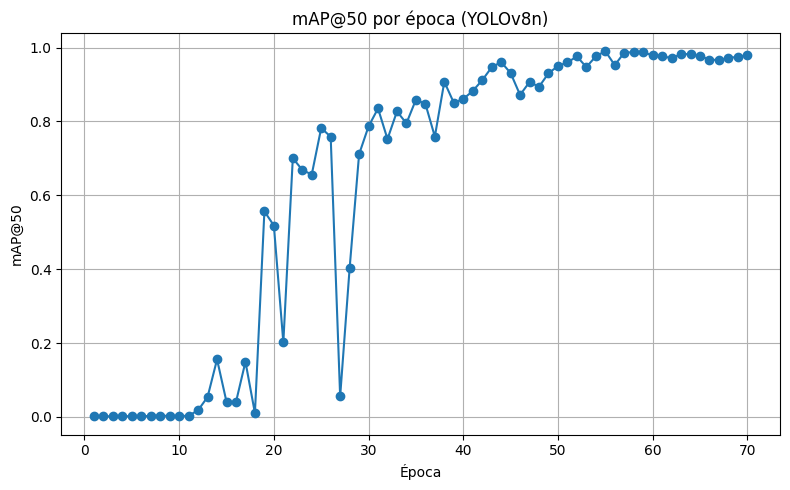

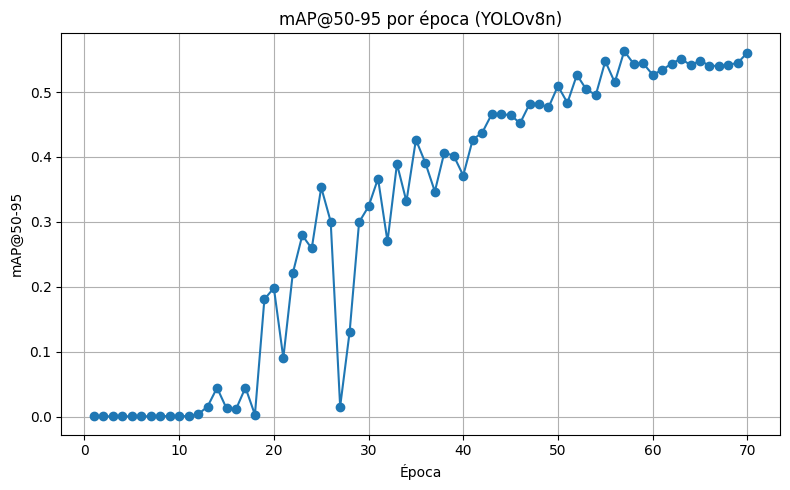

In [ ]:
df = pd.read_csv("comparativa_yolo/yolov8n/results.csv")

# Función para graficar cualquier métrica
def graficar(df, columna, ylabel, titulo, nombre_archivo):
    plt.figure(figsize=(8, 5))
    plt.plot(df['epoch'], df[columna], marker='o', linestyle='-')
    plt.title(titulo)
    plt.xlabel("Época")
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"comparativa_yolo/yolov8n/{nombre_archivo}.png")
    plt.show()

# Graficar cada métrica importante
graficar(df, 'metrics/precision(B)', 'Precisión', 'Precisión por época (YOLOv8n)', 'precision_yolov8n')
graficar(df, 'metrics/recall(B)', 'Recall', 'Recall por época (YOLOv8n)', 'recall_yolov8n')
graficar(df, 'metrics/mAP50(B)', 'mAP@50', 'mAP@50 por época (YOLOv8n)', 'mAP50_yolov8n')
graficar(df, 'metrics/mAP50-95(B)', 'mAP@50-95', 'mAP@50-95 por época (YOLOv8n)', 'mAP50_95_yolov8n')


### CALCULAR TIEMPO DE INFERENCIA MODELO YOLOv8n

In [ ]:
# Cargar el modelo entrenado
yolo_v8n = YOLO("comparativa_yolo/yolov8n/weights/best.pt")

# Ruta al directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([
    os.path.join(test_dir, f)
    for f in os.listdir(test_dir)
    if f.endswith(".png") or f.endswith(".jpg")
])

N = 1

times = []

for image_path in image_files:
    for _ in range(N):
        start = time.time()
        _ = yolo_v8n.predict(source=image_path, conf=0.4, verbose=False)
        end = time.time()
        times.append(end - start)

# Calcular estadísticas
avg_time = sum(times) / len(times)
fps = 1 / avg_time

print(f"🕒 Tiempo promedio por imagen: {avg_time:.4f} segundos")
print(f"⚡ Velocidad estimada: {fps:.2f} FPS")
print(f"📁 Número total de imágenes procesadas: {len(image_files)}")


🕒 Tiempo promedio por imagen: 0.0251 segundos
⚡ Velocidad estimada: 39.92 FPS
📁 Número total de imágenes procesadas: 26


### EVALUAR MODELO YOLOv8n EN TEST

In [ ]:
# Cargar el modelo entrenado
yolo_v8n = YOLO("comparativa_yolo/yolov8n/weights/best.pt")

# Evaluar rendimiento en test
metrics_yolo_v8n = yolo_v8n.val(data="dataset_protesis/data_protesis.yaml", split="test")

# Mostrar métricas relevantes
print(f"mAP@0.5: {metrics_yolo_v8n.box.map50:.3f}")
print(f"mAP@0.5:0.95: {metrics_yolo_v8n.box.map:.3f}")
print(f"Precisión: {metrics_yolo_v8n.box.mp:.3f}")
print(f"Recall: {metrics_yolo_v8n.box.mr:.3f}")


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3018.7±643.5 MB/s, size: 331.7 KB)


val: Scanning /content/dataset_protesis/labels/test... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<00:00, 957.90it/s]

val: New cache created: /content/dataset_protesis/labels/test.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]


                   all         26         26      0.814      0.885      0.942      0.538
Speed: 7.0ms preprocess, 10.6ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to runs/detect/val
mAP@0.5: 0.942
mAP@0.5:0.95: 0.538
Precisión: 0.814
Recall: 0.885


### VISUALIZAR RESULTADOS MODELO YOLOv8n


image 1/1 /content/dataset_protesis/images/test/rgb_10.png: 480x640 1 protesis, 7.6ms
Speed: 1.7ms preprocess, 7.6ms inference, 1.6ms postprocess per image at shape (1, 3, 480, 640)


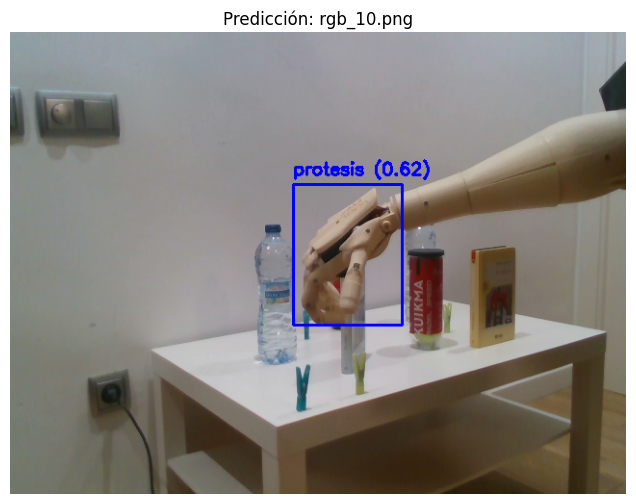


image 1/1 /content/dataset_protesis/images/test/rgb_100.png: 480x640 1 protesis, 10.7ms
Speed: 2.1ms preprocess, 10.7ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


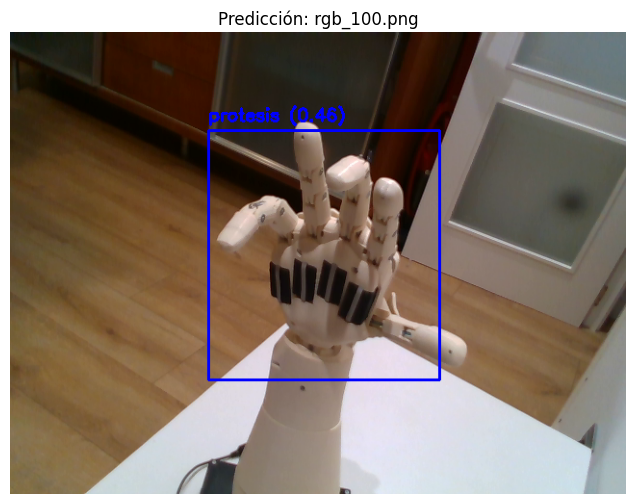


image 1/1 /content/dataset_protesis/images/test/rgb_102.png: 480x640 1 protesis, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


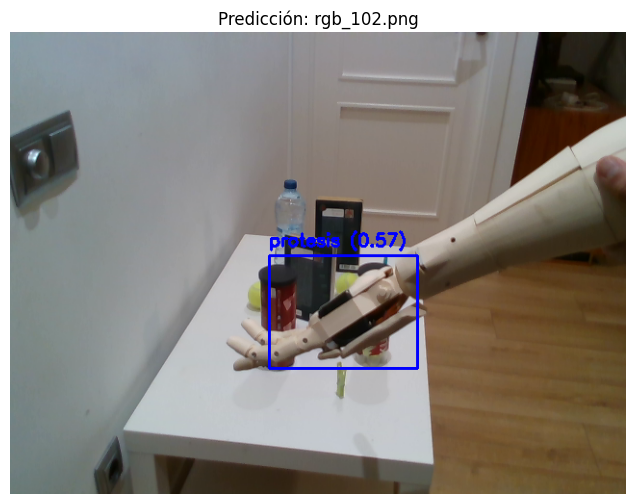


image 1/1 /content/dataset_protesis/images/test/rgb_103.png: 480x640 1 protesis, 9.9ms
Speed: 2.2ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


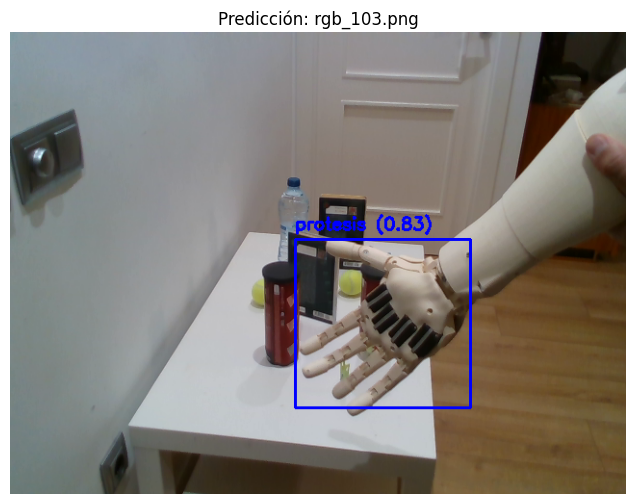


image 1/1 /content/dataset_protesis/images/test/rgb_107.png: 480x640 1 protesis, 14.4ms
Speed: 2.3ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


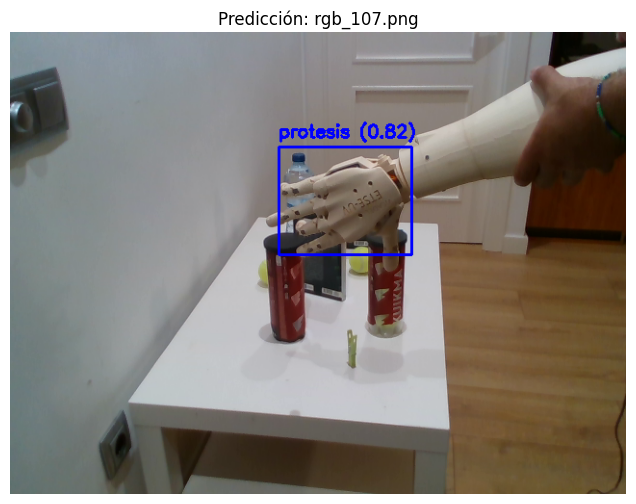


image 1/1 /content/dataset_protesis/images/test/rgb_108.png: 480x640 1 protesis, 12.1ms
Speed: 2.5ms preprocess, 12.1ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)


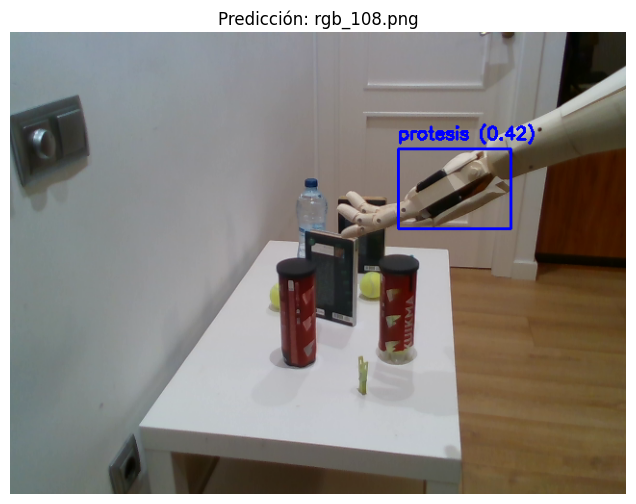


image 1/1 /content/dataset_protesis/images/test/rgb_113.png: 480x640 1 protesis, 11.9ms
Speed: 2.2ms preprocess, 11.9ms inference, 1.8ms postprocess per image at shape (1, 3, 480, 640)


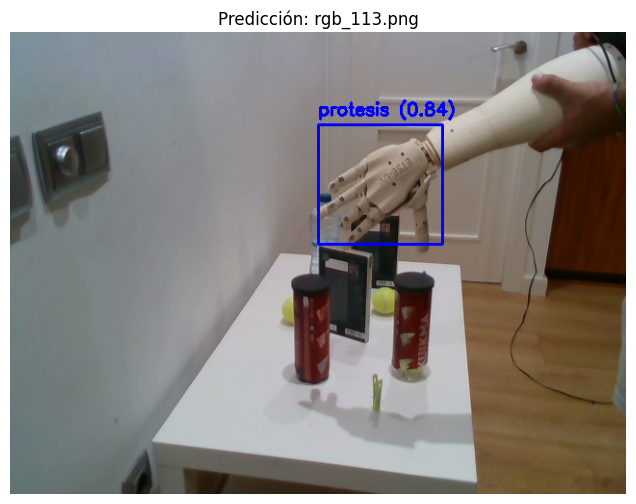


image 1/1 /content/dataset_protesis/images/test/rgb_123.png: 480x640 1 protesis, 9.9ms
Speed: 2.4ms preprocess, 9.9ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


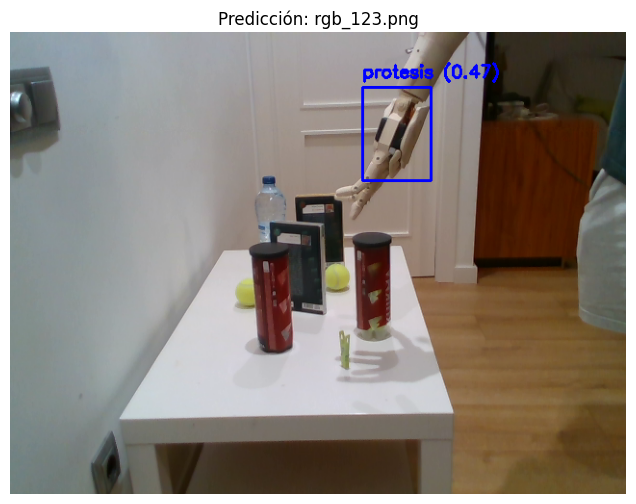


image 1/1 /content/dataset_protesis/images/test/rgb_124.png: 480x640 1 protesis, 11.2ms
Speed: 2.8ms preprocess, 11.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


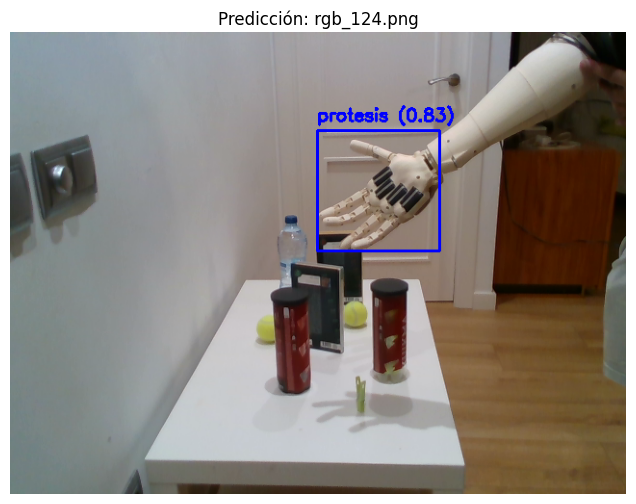

In [ ]:
# Definir colores para cada clase (en BGR para OpenCV)
class_colors = {
    0: (255, 0, 0),    # protesis - azul
}

# Nombres de las clases
class_names = ["protesis"]

# Directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([f for f in os.listdir(test_dir) if f.endswith(".png") or f.endswith(".jpg")])

# Mostrar algunas imágenes con bounding boxes
for file in image_files[:9]:
    path = os.path.join(test_dir, file)
    results = yolo_v8n(path, conf=0.4)[0]

    image = cv2.imread(path)

    for box in results.boxes:
        cls = int(box.cls[0].item())
        conf = box.conf[0].item()
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        color = class_colors.get(cls, (255, 255, 255))
        label = f"{class_names[cls]} ({conf:.2f})"

        # Dibujar caja y texto
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    # Mostrar con matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"Predicción: {file}")
    plt.show()


# MODELO YOLOv8s

### ENTRENAMIENTO YOLOv8s

In [ ]:
yolo_v8s = YOLO("yolov8s.yaml")

yolo_v8s.train(
    data="dataset_protesis/data_protesis.yaml",
    epochs=70,
    imgsz=640,
    batch=16,
    project="comparativa_yolo",
    name="yolov8s",
    exist_ok=True
)


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_protesis/data_protesis.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8s, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, 

train: Scanning /content/dataset_protesis/labels/train.cache... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1242.1±1016.2 MB/s, size: 333.2 KB)


val: Scanning /content/dataset_protesis/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to comparativa_yolo/yolov8s/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to comparativa_yolo/yolov8s
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      3.86G      3.108      4.486      4.262         26        640: 100%|██████████| 11/11 [00:05<00:00,  2.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]

                   all         50         50    0.00148       0.42    0.00127   0.000443



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      4.43G      3.048       4.04      4.133         24        640: 100%|██████████| 11/11 [00:03<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.28it/s]

                   all         50         50    0.00149       0.42    0.00144   0.000528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      4.43G      2.929      3.659      3.971         28        640: 100%|██████████| 11/11 [00:03<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         50         50    0.00143        0.4    0.00137    0.00052



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      4.43G      2.829      3.364      3.721         26        640: 100%|██████████| 11/11 [00:03<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         50         50     0.0014        0.4    0.00219   0.000685



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      4.43G      2.833      3.094      3.606         24        640: 100%|██████████| 11/11 [00:03<00:00,  3.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.20it/s]


                   all         50         50    0.00119       0.18    0.00112   0.000291

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      4.43G      2.772      3.048      3.442         25        640: 100%|██████████| 11/11 [00:03<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.70it/s]

                   all         50         50     0.0011       0.16    0.00107   0.000263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      4.43G       2.78      2.794      3.395         36        640: 100%|██████████| 11/11 [00:03<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.22it/s]


                   all         50         50    0.00124       0.24    0.00116   0.000222

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      4.43G      2.733      2.912      3.315         33        640: 100%|██████████| 11/11 [00:03<00:00,  3.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.15it/s]

                   all         50         50    0.00227       0.36    0.00192    0.00061



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      4.43G      2.665      2.707      3.259         33        640: 100%|██████████| 11/11 [00:03<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.45it/s]

                   all         50         50    0.00287       0.86    0.00308   0.000918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      4.43G      2.565       2.58      3.165         27        640: 100%|██████████| 11/11 [00:03<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.29it/s]

                   all         50         50    0.00233        0.7    0.00896    0.00209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      4.43G      2.512      2.416      3.073         32        640: 100%|██████████| 11/11 [00:03<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all         50         50    0.00287       0.86     0.0104     0.0028



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      4.43G      2.523      2.433      3.081         33        640: 100%|██████████| 11/11 [00:03<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         50         50      0.214       0.08     0.0778     0.0168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      4.43G      2.586      2.281      3.078         26        640: 100%|██████████| 11/11 [00:03<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         50         50       0.23        0.2      0.155     0.0445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      4.43G      2.478      2.347      3.039         28        640: 100%|██████████| 11/11 [00:03<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.75it/s]

                   all         50         50     0.0509       0.26     0.0387     0.0117



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      4.43G      2.516      2.273       3.07         34        640: 100%|██████████| 11/11 [00:03<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.87it/s]

                   all         50         50      0.392        0.2      0.197     0.0644



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      4.44G      2.507      2.249      3.052         35        640: 100%|██████████| 11/11 [00:03<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         50         50      0.117       0.32     0.0951     0.0272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      4.44G      2.569      2.187      3.045         36        640: 100%|██████████| 11/11 [00:03<00:00,  2.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         50      0.206        0.5      0.229     0.0658



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      4.48G      2.412      2.112      3.031         35        640: 100%|██████████| 11/11 [00:03<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]

                   all         50         50      0.176       0.24      0.183     0.0525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      4.48G      2.425      2.003      2.996         31        640: 100%|██████████| 11/11 [00:03<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.59it/s]

                   all         50         50      0.559       0.32       0.35      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      4.48G      2.233      1.975      2.877         28        640: 100%|██████████| 11/11 [00:03<00:00,  2.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         50         50      0.356       0.58      0.399      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      4.52G      2.214      1.924      2.804         25        640: 100%|██████████| 11/11 [00:03<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         50         50      0.578       0.56      0.562      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      4.52G      2.282      1.806      2.833         36        640: 100%|██████████| 11/11 [00:03<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         50         50      0.571       0.66      0.644      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      4.55G      2.438      1.826      2.908         27        640: 100%|██████████| 11/11 [00:03<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50         50       0.73      0.705      0.803      0.329



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      4.55G      2.252      1.774      2.823         34        640: 100%|██████████| 11/11 [00:03<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.11it/s]

                   all         50         50      0.526       0.76      0.677      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      4.55G      2.211      1.705      2.741         29        640: 100%|██████████| 11/11 [00:03<00:00,  3.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all         50         50      0.768      0.796       0.86      0.322



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      4.59G      2.188      1.687      2.764         33        640: 100%|██████████| 11/11 [00:03<00:00,  3.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.96it/s]

                   all         50         50       0.78      0.852      0.899      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      4.59G      2.088      1.615      2.674         26        640: 100%|██████████| 11/11 [00:03<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         50         50      0.598       0.72      0.712      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      4.59G      2.148      1.565      2.681         24        640: 100%|██████████| 11/11 [00:03<00:00,  2.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         50         50      0.729        0.5      0.528      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      4.59G      2.092      1.596      2.629         31        640: 100%|██████████| 11/11 [00:03<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.89it/s]

                   all         50         50      0.491       0.66      0.522      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      4.59G      2.046      1.603      2.658         32        640: 100%|██████████| 11/11 [00:03<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.54it/s]

                   all         50         50       0.75       0.64      0.678      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      4.59G      2.018      1.569      2.641         29        640: 100%|██████████| 11/11 [00:03<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.60it/s]

                   all         50         50      0.645       0.48       0.55      0.206



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      4.59G      2.001      1.537      2.637         39        640: 100%|██████████| 11/11 [00:03<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]

                   all         50         50      0.742       0.86      0.891      0.445



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      4.59G      2.062      1.536      2.651         27        640: 100%|██████████| 11/11 [00:03<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.66it/s]

                   all         50         50      0.462       0.78      0.593      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      4.59G      2.022      1.536      2.572         34        640: 100%|██████████| 11/11 [00:03<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.79it/s]

                   all         50         50      0.596      0.915      0.807      0.377



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      4.59G      2.012      1.431       2.58         23        640: 100%|██████████| 11/11 [00:03<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.89it/s]

                   all         50         50      0.916       0.88      0.959      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      4.59G      1.932      1.409      2.533         23        640: 100%|██████████| 11/11 [00:03<00:00,  3.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         50         50      0.759       0.82      0.872      0.352



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      4.59G      1.937      1.368      2.539         29        640: 100%|██████████| 11/11 [00:03<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.71it/s]

                   all         50         50      0.925        0.9       0.97      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      4.59G      1.918      1.406      2.506         26        640: 100%|██████████| 11/11 [00:03<00:00,  3.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.73it/s]

                   all         50         50      0.914      0.847      0.943      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      4.59G      1.844      1.298      2.436         33        640: 100%|██████████| 11/11 [00:03<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.76it/s]

                   all         50         50      0.938       0.88      0.974      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      4.59G      1.882      1.252      2.455         32        640: 100%|██████████| 11/11 [00:03<00:00,  3.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.97it/s]

                   all         50         50      0.873       0.98      0.964      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      4.59G      1.836      1.287      2.413         28        640: 100%|██████████| 11/11 [00:03<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.63it/s]

                   all         50         50      0.865        0.9      0.956      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      4.59G      2.003      1.371      2.541         25        640: 100%|██████████| 11/11 [00:03<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.58it/s]

                   all         50         50      0.729       0.43      0.529      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      4.59G      1.774      1.273      2.381         34        640: 100%|██████████| 11/11 [00:03<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

                   all         50         50      0.951       0.86      0.936      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      4.59G      1.715      1.273      2.348         26        640: 100%|██████████| 11/11 [00:03<00:00,  3.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all         50         50      0.821       0.92      0.946      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      4.59G      1.678      1.186      2.305         21        640: 100%|██████████| 11/11 [00:03<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         50         50      0.919       0.76      0.884      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      4.59G      1.839      1.238      2.402         28        640: 100%|██████████| 11/11 [00:03<00:00,  3.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.47it/s]

                   all         50         50      0.867       0.86      0.943      0.483



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      4.59G      1.717      1.257      2.358         36        640: 100%|██████████| 11/11 [00:03<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.78it/s]

                   all         50         50      0.893       0.67      0.773      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      4.59G        1.7      1.246      2.317         24        640: 100%|██████████| 11/11 [00:03<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.98it/s]

                   all         50         50      0.932      0.823      0.923      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      4.59G      1.751      1.224      2.341         34        640: 100%|██████████| 11/11 [00:03<00:00,  3.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.61it/s]

                   all         50         50      0.916       0.82      0.892      0.338



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      4.59G      1.696       1.21      2.333         30        640: 100%|██████████| 11/11 [00:03<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         50         50      0.898        0.9      0.957      0.531



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      4.59G      1.744      1.171      2.299         30        640: 100%|██████████| 11/11 [00:03<00:00,  3.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.95it/s]

                   all         50         50      0.874       0.84      0.881      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      4.59G      1.675      1.172       2.26         24        640: 100%|██████████| 11/11 [00:03<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all         50         50      0.926       0.98       0.99      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      4.59G      1.724      1.175      2.263         35        640: 100%|██████████| 11/11 [00:03<00:00,  2.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         50         50       0.97       0.92      0.987      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      4.59G       1.63      1.101      2.277         28        640: 100%|██████████| 11/11 [00:03<00:00,  3.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.73it/s]

                   all         50         50      0.957       0.92      0.976      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      4.59G      1.614      1.104      2.198         36        640: 100%|██████████| 11/11 [00:03<00:00,  3.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.26it/s]

                   all         50         50      0.868      0.922      0.949       0.52



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      4.59G      1.572      1.042      2.206         32        640: 100%|██████████| 11/11 [00:04<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         50         50      0.904      0.941      0.967      0.523



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      4.59G      1.643      1.042      2.228         23        640: 100%|██████████| 11/11 [00:03<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         50         50      0.909       0.92      0.972      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      4.59G      1.626      1.082      2.232         30        640: 100%|██████████| 11/11 [00:03<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         50         50      0.916       0.94      0.985      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      4.59G      1.617      1.096      2.252         23        640: 100%|██████████| 11/11 [00:03<00:00,  2.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         50         50          1      0.958      0.986      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      4.59G      1.603      1.098      2.208         25        640: 100%|██████████| 11/11 [00:03<00:00,  3.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.08it/s]

                   all         50         50      0.945       0.94      0.979      0.539


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      4.59G      1.347      1.047      2.135         15        640: 100%|██████████| 11/11 [00:06<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.82it/s]

                   all         50         50      0.959      0.935      0.987      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      4.59G      1.416      1.002      2.116         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]

                   all         50         50      0.937       0.92      0.983       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      4.59G      1.416      1.004       2.12         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         50         50      0.958       0.84      0.966      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      4.59G      1.468     0.9705      2.184         15        640: 100%|██████████| 11/11 [00:03<00:00,  2.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         50         50      0.827      0.958      0.965      0.556



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      4.59G      1.374     0.8925      2.086         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         50         50      0.891       0.92      0.972       0.57



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      4.59G      1.363     0.9487      2.047         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         50      0.939       0.92      0.978      0.579



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      4.59G      1.385     0.8958      2.097         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         50         50       0.94      0.943      0.985      0.555



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      4.59G      1.337     0.8551      2.063         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]

                   all         50         50      0.964          1       0.99      0.543



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      4.59G      1.299     0.8428      1.977         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.08it/s]

                   all         50         50      0.968       0.94      0.987      0.569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      4.59G      1.323     0.8373      2.003         15        640: 100%|██████████| 11/11 [00:03<00:00,  3.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.38it/s]

                   all         50         50      0.972       0.94      0.986      0.571



70 epochs completed in 0.094 hours.
Optimizer stripped from comparativa_yolo/yolov8s/weights/last.pt, 22.5MB
Optimizer stripped from comparativa_yolo/yolov8s/weights/best.pt, 22.5MB

Validating comparativa_yolo/yolov8s/weights/best.pt...
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.62it/s]


                   all         50         50      0.939       0.92      0.978      0.577
Speed: 0.3ms preprocess, 4.6ms inference, 0.0ms loss, 2.6ms postprocess per image
Results saved to comparativa_yolo/yolov8s


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f9143242d0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### GRAFICAR MÉTRICAS YOLOv8s

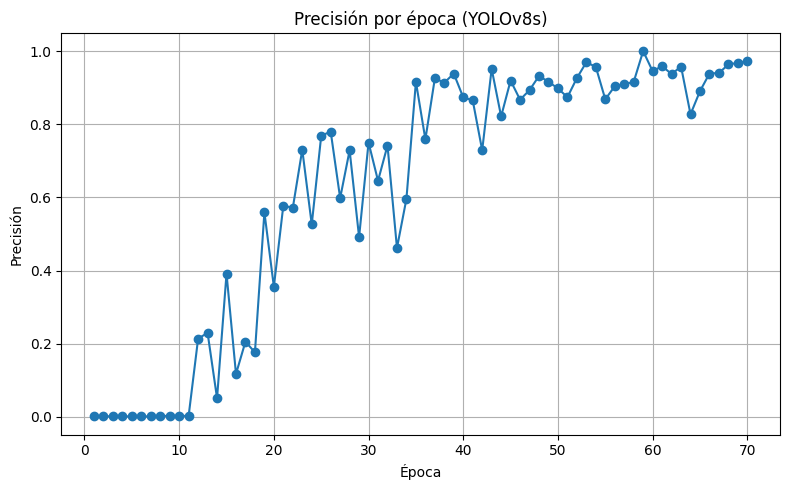

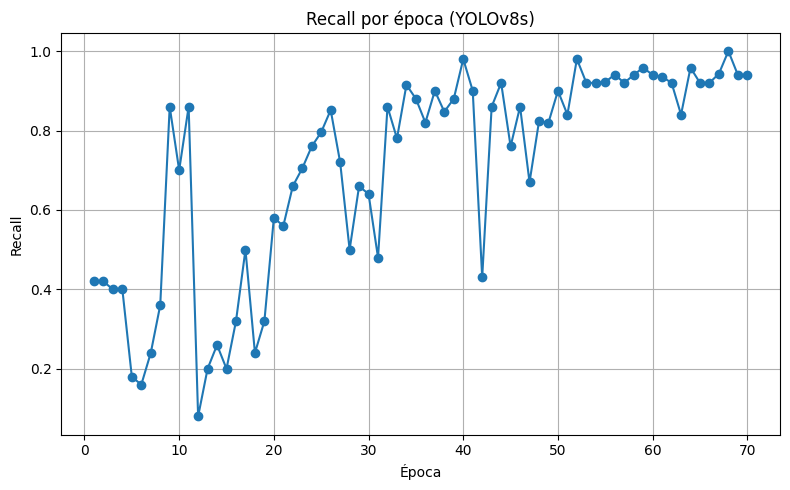

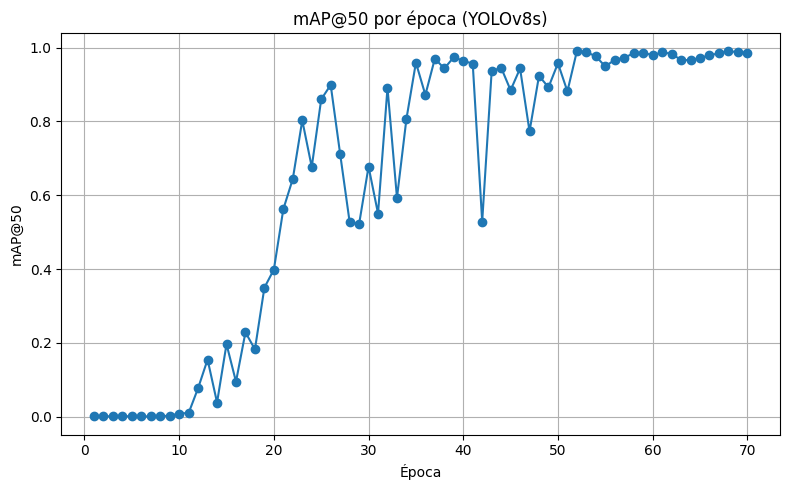

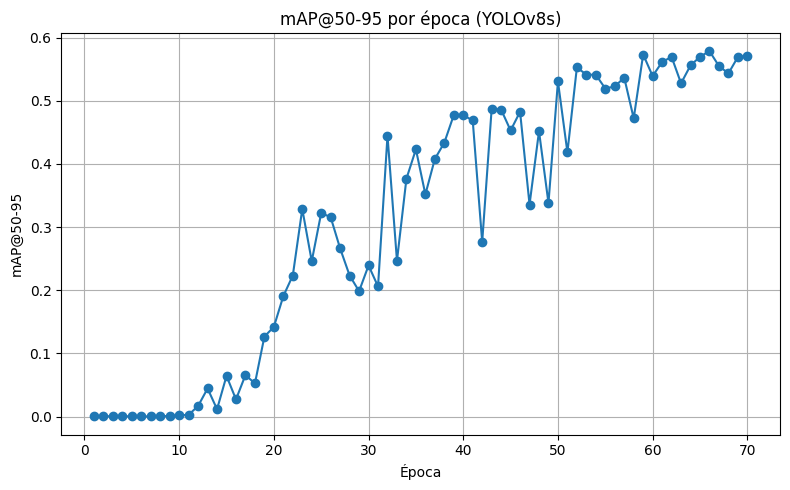

In [ ]:
df = pd.read_csv("comparativa_yolo/yolov8s/results.csv")

# Función para graficar cualquier métrica
def graficar(df, columna, ylabel, titulo, nombre_archivo):
    plt.figure(figsize=(8, 5))
    plt.plot(df['epoch'], df[columna], marker='o', linestyle='-')
    plt.title(titulo)
    plt.xlabel("Época")
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"comparativa_yolo/yolov8s/{nombre_archivo}.png")
    plt.show()

# Graficar cada métrica importante
graficar(df, 'metrics/precision(B)', 'Precisión', 'Precisión por época (YOLOv8s)', 'precision_yolov8s')
graficar(df, 'metrics/recall(B)', 'Recall', 'Recall por época (YOLOv8s)', 'recall_yolov8s')
graficar(df, 'metrics/mAP50(B)', 'mAP@50', 'mAP@50 por época (YOLOv8s)', 'mAP50_yolov8s')
graficar(df, 'metrics/mAP50-95(B)', 'mAP@50-95', 'mAP@50-95 por época (YOLOv8s)', 'mAP50_95_yolov8s')


### CALCULAR TIEMPO DE INFERENCIA MODELO YOLOv8s

In [ ]:
# Cargar el modelo entrenado
yolo_v8s = YOLO("comparativa_yolo/yolov8s/weights/best.pt")

# Ruta al directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([
    os.path.join(test_dir, f)
    for f in os.listdir(test_dir)
    if f.endswith(".png") or f.endswith(".jpg")
])

N = 1

times = []

for image_path in image_files:
    for _ in range(N):
        start = time.time()
        _ = yolo_v8s.predict(source=image_path, conf=0.4, verbose=False)
        end = time.time()
        times.append(end - start)

# Calcular estadísticas
avg_time = sum(times) / len(times)
fps = 1 / avg_time

print(f"🕒 Tiempo promedio por imagen: {avg_time:.4f} segundos")
print(f"⚡ Velocidad estimada: {fps:.2f} FPS")
print(f"📁 Número total de imágenes procesadas: {len(image_files)}")


🕒 Tiempo promedio por imagen: 0.0344 segundos
⚡ Velocidad estimada: 29.08 FPS
📁 Número total de imágenes procesadas: 26


### EVALUAR MODELO YOLOv8s EN TEST

In [ ]:
# Cargar el modelo entrenado
yolo_v8s = YOLO("comparativa_yolo/yolov8s/weights/best.pt")

# Evaluar rendimiento en test
metrics_yolo_v8s = yolo_v8s.val(data="dataset_protesis/data_protesis.yaml", split="test")

# Mostrar métricas relevantes
print(f"mAP@0.5: {metrics_yolo_v8s.box.map50:.3f}")
print(f"mAP@0.5:0.95: {metrics_yolo_v8s.box.map:.3f}")
print(f"Precisión: {metrics_yolo_v8s.box.mp:.3f}")
print(f"Recall: {metrics_yolo_v8s.box.mr:.3f}")


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4037.9±1340.1 MB/s, size: 331.7 KB)


val: Scanning /content/dataset_protesis/labels/test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]


                   all         26         26      0.911      0.783      0.939      0.563
Speed: 4.5ms preprocess, 13.3ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/val2
mAP@0.5: 0.939
mAP@0.5:0.95: 0.563
Precisión: 0.911
Recall: 0.783


### VISUALIZAR RESULTADOS MODELO YOLOv8s


image 1/1 /content/dataset_protesis/images/test/rgb_10.png: 480x640 1 protesis, 14.2ms
Speed: 2.0ms preprocess, 14.2ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


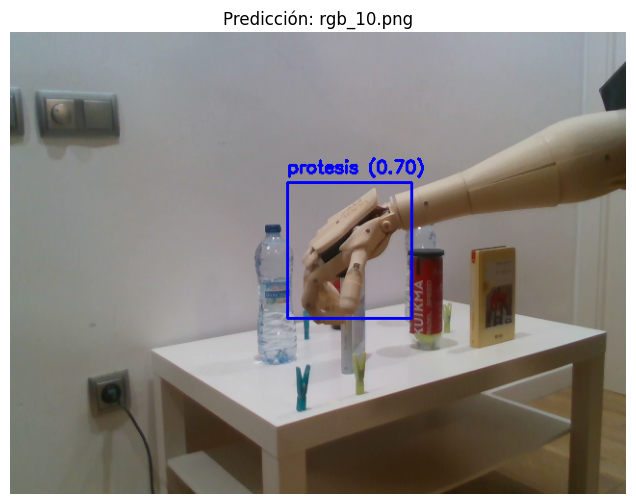


image 1/1 /content/dataset_protesis/images/test/rgb_100.png: 480x640 1 protesis, 13.5ms
Speed: 3.3ms preprocess, 13.5ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


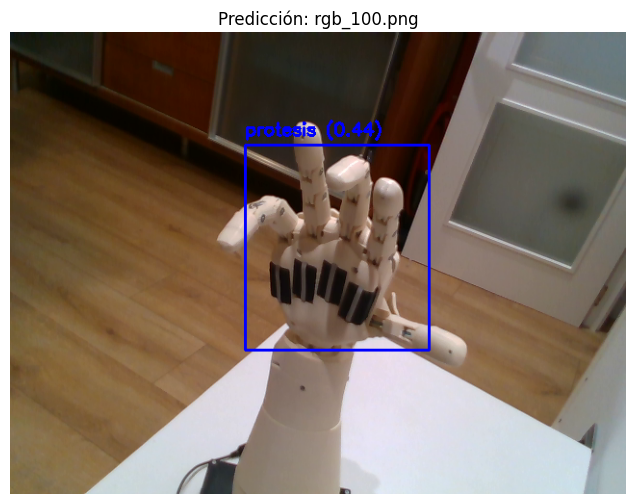


image 1/1 /content/dataset_protesis/images/test/rgb_102.png: 480x640 1 protesis, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


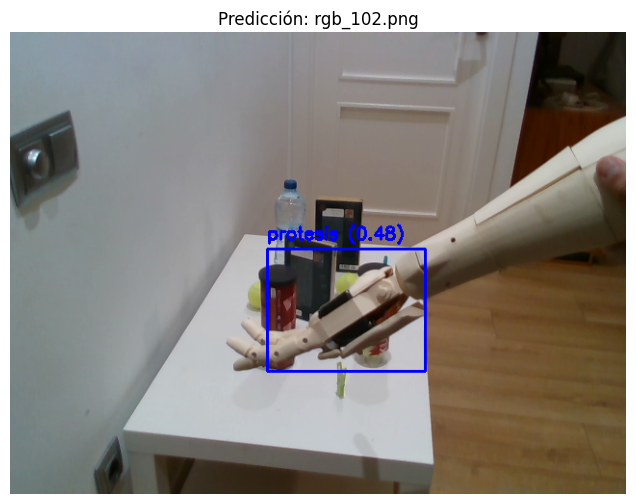


image 1/1 /content/dataset_protesis/images/test/rgb_103.png: 480x640 1 protesis, 13.3ms
Speed: 2.8ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


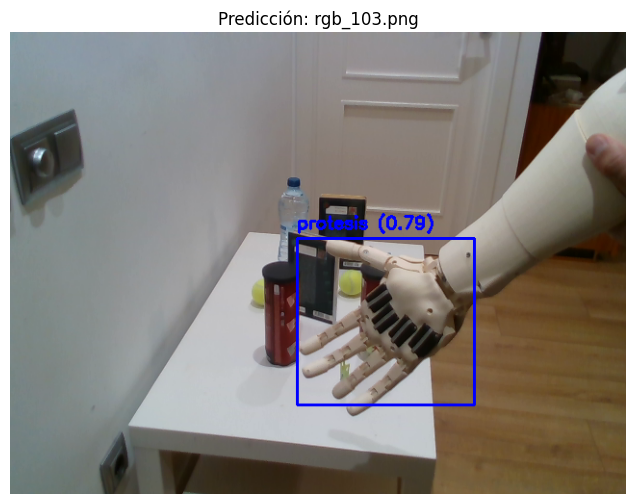


image 1/1 /content/dataset_protesis/images/test/rgb_107.png: 480x640 1 protesis, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 1.9ms postprocess per image at shape (1, 3, 480, 640)


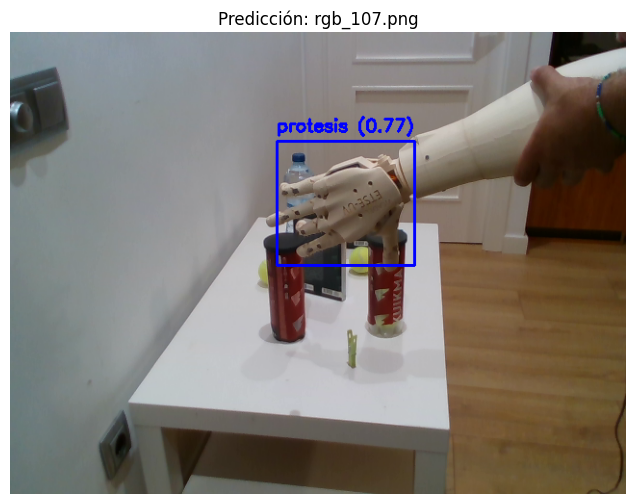


image 1/1 /content/dataset_protesis/images/test/rgb_108.png: 480x640 2 protesiss, 13.3ms
Speed: 2.5ms preprocess, 13.3ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


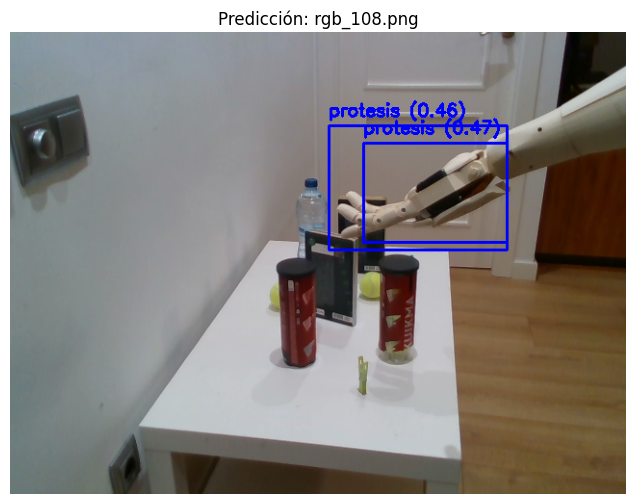


image 1/1 /content/dataset_protesis/images/test/rgb_113.png: 480x640 1 protesis, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


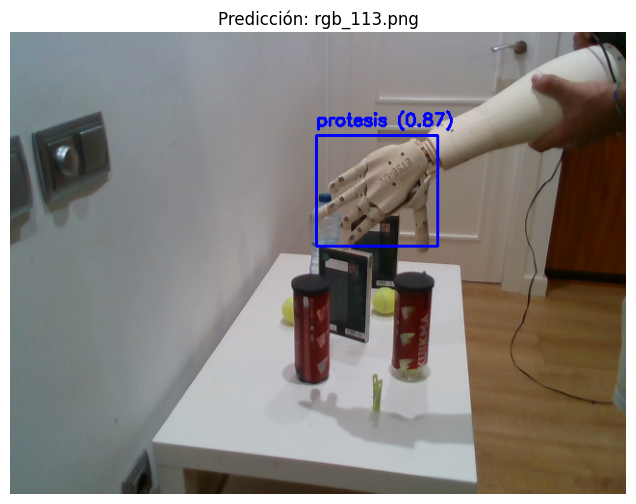


image 1/1 /content/dataset_protesis/images/test/rgb_123.png: 480x640 1 protesis, 13.3ms
Speed: 2.7ms preprocess, 13.3ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


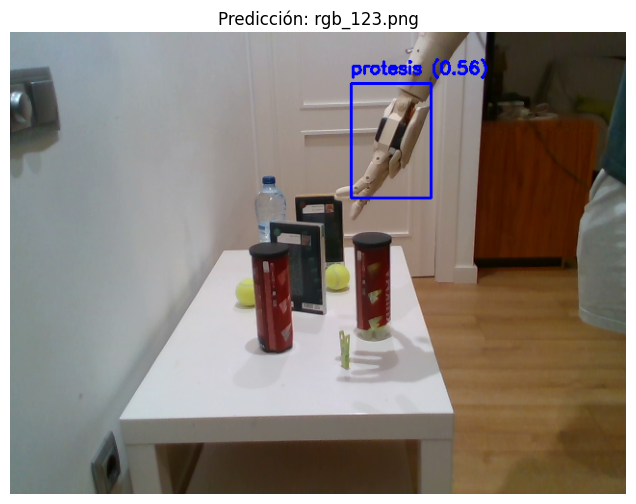


image 1/1 /content/dataset_protesis/images/test/rgb_124.png: 480x640 1 protesis, 13.3ms
Speed: 2.6ms preprocess, 13.3ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


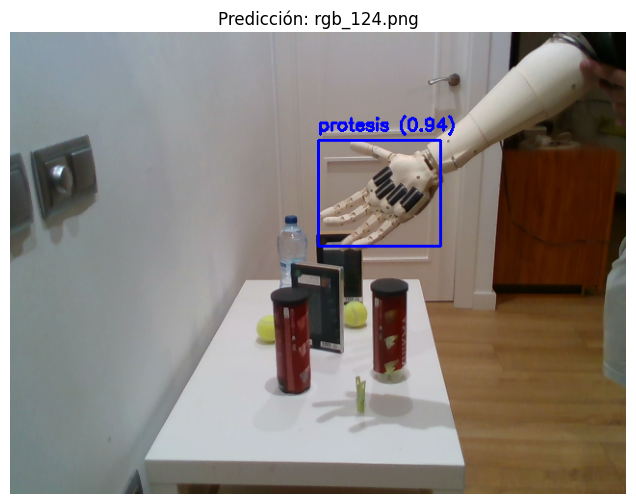

In [ ]:
# Definir colores para cada clase (en BGR para OpenCV)
class_colors = {
    0: (255, 0, 0),    # protesis - azul
}

# Nombres de las clases
class_names = ["protesis"]

# Directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([f for f in os.listdir(test_dir) if f.endswith(".png") or f.endswith(".jpg")])

# Mostrar algunas imágenes con bounding boxes
for file in image_files[:9]:  # Cambia a más si quieres
    path = os.path.join(test_dir, file)
    results = yolo_v8s(path, conf=0.4)[0]

    image = cv2.imread(path)

    for box in results.boxes:
        cls = int(box.cls[0].item())
        conf = box.conf[0].item()
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        color = class_colors.get(cls, (255, 255, 255))
        label = f"{class_names[cls]} ({conf:.2f})"

        # Dibujar caja y texto
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    # Mostrar con matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"Predicción: {file}")
    plt.show()



# MODELO YOLOv8m

### ENTRENAMIENTO YOLOv8m

In [ ]:
yolo_v8m = YOLO("yolov8m.yaml")

yolo_v8m.train(
    data="dataset_protesis/data_protesis.yaml",
    epochs=70,
    imgsz=640,
    batch=16,
    project="comparativa_yolo",
    name="yolov8m",
    exist_ok=True
)


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_protesis/data_protesis.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8m, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, 

train: Scanning /content/dataset_protesis/labels/train.cache... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1114.1±992.2 MB/s, size: 333.2 KB)


val: Scanning /content/dataset_protesis/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to comparativa_yolo/yolov8m/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to comparativa_yolo/yolov8m
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      6.38G      3.127      4.465      4.269         26        640: 100%|██████████| 11/11 [00:06<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.89it/s]

                   all         50         50    0.00148       0.42    0.00122   0.000441



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      7.24G       3.03      4.007      4.151         24        640: 100%|██████████| 11/11 [00:06<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.12it/s]

                   all         50         50    0.00137        0.4    0.00171   0.000611



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      7.24G       2.93      3.604      3.928         28        640: 100%|██████████| 11/11 [00:05<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         50         50    0.00145       0.42    0.00145   0.000479



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70      7.24G      2.787       3.36      3.635         26        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.87it/s]

                   all         50         50     0.0014        0.4    0.00351   0.000825



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      7.27G       2.86      3.158       3.46         24        640: 100%|██████████| 11/11 [00:06<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         50         50    0.00149       0.18    0.00134   0.000302



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      7.27G      2.794       3.16      3.404         25        640: 100%|██████████| 11/11 [00:05<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         50         50     0.0014       0.12    0.00501   0.000739



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      7.34G      2.713      2.918      3.251         36        640: 100%|██████████| 11/11 [00:05<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.19it/s]

                   all         50         50    0.00397       0.12    0.00351   0.000709



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70      6.57G      2.678      2.945      3.293         33        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.49it/s]

                   all         50         50    0.00358        0.1    0.00205   0.000358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70      6.44G      2.577      2.672      3.085         33        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.25it/s]

                   all         50         50    0.00177        0.2    0.00151   0.000299



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70       7.3G      2.612      2.467      3.096         27        640: 100%|██████████| 11/11 [00:05<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         50         50    0.00262       0.34    0.00203   0.000661



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70      7.32G      2.489      2.353      3.011         32        640: 100%|██████████| 11/11 [00:05<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         50         50     0.0438       0.06     0.0125    0.00427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      7.32G      2.619      2.656      3.107         33        640: 100%|██████████| 11/11 [00:05<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         50         50      0.206       0.12     0.0481     0.0174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      7.32G      2.561      2.393       2.97         26        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         50         50    0.00218       0.48     0.0025   0.000569



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      7.32G      2.444      2.263      2.911         28        640: 100%|██████████| 11/11 [00:05<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.00it/s]

                   all         50         50    0.00372       0.14    0.00241   0.000649



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      7.32G      2.421      2.239      2.936         34        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         50         50     0.0049       0.04    0.00422   0.000957



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      7.32G      2.368      2.107      2.913         35        640: 100%|██████████| 11/11 [00:05<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]

                   all         50         50    0.00434       0.18    0.00271    0.00074



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      7.39G      2.473       2.04      2.904         36        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         50    0.00134       0.04   0.000713   0.000313



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70       6.4G       2.42      2.055       2.95         35        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         50         50    0.00398       0.06    0.00224   0.000886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70       6.4G      2.378      2.034      2.953         31        640: 100%|██████████| 11/11 [00:05<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         50         50    0.00389       0.14    0.00287    0.00171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      6.47G      2.142      1.967      2.809         28        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.05it/s]

                   all         50         50     0.0242        0.6     0.0411     0.0138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      6.47G      2.129      1.843      2.657         25        640: 100%|██████████| 11/11 [00:05<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]

                   all         50         50     0.0174       0.36     0.0231    0.00973



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      6.85G      2.149      1.758      2.678         36        640: 100%|██████████| 11/11 [00:05<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.31it/s]

                   all         50         50    0.00279       0.04    0.00173   0.000469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      6.85G       2.28      1.824      2.765         27        640: 100%|██████████| 11/11 [00:05<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         50         50    0.00413        0.1     0.0025    0.00134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70      6.85G      2.119      1.766      2.721         34        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         50         50      0.365       0.58      0.356       0.15



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      6.85G      2.135      1.711      2.635         29        640: 100%|██████████| 11/11 [00:05<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         50         50      0.419      0.317      0.412      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      6.85G      2.089      1.627      2.612         33        640: 100%|██████████| 11/11 [00:05<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         50         50      0.439      0.392      0.385      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      6.85G       2.01      1.594      2.563         26        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         50         50      0.627        0.6      0.641      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70      6.85G       2.02      1.556      2.535         24        640: 100%|██████████| 11/11 [00:05<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50         50      0.491       0.68      0.597      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      6.85G      1.982       1.53      2.512         31        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]

                   all         50         50       0.69      0.669       0.81      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70      6.85G      2.005      1.554      2.559         32        640: 100%|██████████| 11/11 [00:05<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         50         50      0.651      0.522       0.69      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      6.85G      1.983      1.575      2.556         29        640: 100%|██████████| 11/11 [00:05<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50         50      0.678      0.799      0.803      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      6.85G      1.931        1.5      2.475         39        640: 100%|██████████| 11/11 [00:05<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.08it/s]

                   all         50         50      0.862      0.751      0.904      0.394



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      6.85G      2.017      1.539      2.503         27        640: 100%|██████████| 11/11 [00:05<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         50         50      0.807      0.753      0.844      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      6.85G      1.977      1.531      2.493         34        640: 100%|██████████| 11/11 [00:05<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]

                   all         50         50      0.796       0.88      0.881      0.382



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      6.85G      1.919      1.426        2.5         23        640: 100%|██████████| 11/11 [00:05<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50         50      0.807       0.74      0.874      0.428



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      6.85G      1.817       1.43      2.447         23        640: 100%|██████████| 11/11 [00:05<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         50         50      0.848      0.783      0.911      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      6.85G      1.818      1.357       2.39         29        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         50         50      0.779      0.847      0.898      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      6.85G      1.842      1.397      2.402         26        640: 100%|██████████| 11/11 [00:05<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         50         50      0.792       0.88      0.893      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      6.85G      1.769      1.262      2.331         33        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         50         50      0.812      0.518      0.797      0.386



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70      6.85G      1.808       1.25      2.383         32        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.13it/s]

                   all         50         50      0.892       0.92      0.979      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      6.85G      1.855      1.266      2.381         28        640: 100%|██████████| 11/11 [00:05<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         50      0.789        0.8      0.878      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      6.91G      1.858      1.283      2.414         25        640: 100%|██████████| 11/11 [00:05<00:00,  1.99it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         50         50       0.84       0.84      0.908      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      6.98G      1.692      1.258      2.278         34        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.17it/s]

                   all         50         50      0.774       0.88      0.915      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      7.01G      1.736      1.306      2.337         26        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.10it/s]

                   all         50         50      0.777       0.92      0.896      0.427



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      7.01G      1.709      1.241      2.239         21        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         50         50      0.797        0.8      0.873      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      7.01G      1.754      1.239      2.323         28        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         50         50      0.777      0.835      0.858      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      7.01G      1.659      1.152      2.226         36        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]

                   all         50         50      0.777       0.92      0.895      0.403



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      7.01G       1.74       1.15      2.248         24        640: 100%|██████████| 11/11 [00:05<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         50      0.848      0.893      0.939      0.453



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      7.01G      1.711      1.201      2.245         34        640: 100%|██████████| 11/11 [00:05<00:00,  1.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         50         50      0.754       0.92      0.898      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      7.01G      1.661      1.143      2.267         30        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.00it/s]

                   all         50         50      0.885       0.94      0.968      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      7.01G      1.691      1.118       2.24         30        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         50         50       0.93       0.94      0.967      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70      7.01G      1.625      1.092      2.182         24        640: 100%|██████████| 11/11 [00:05<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.09it/s]

                   all         50         50      0.877      0.853      0.936      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      7.01G       1.69      1.149      2.212         35        640: 100%|██████████| 11/11 [00:05<00:00,  1.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         50         50      0.851       0.76      0.865      0.376



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      7.01G      1.658      1.061      2.259         28        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.08it/s]

                   all         50         50      0.886       0.88      0.956      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      7.01G      1.596      1.069      2.138         36        640: 100%|██████████| 11/11 [00:05<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]

                   all         50         50      0.805      0.909      0.941      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70      7.01G      1.538      1.069      2.145         32        640: 100%|██████████| 11/11 [00:05<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.06it/s]

                   all         50         50       0.86       0.92      0.968      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70      7.01G      1.572      1.057       2.13         23        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]

                   all         50         50      0.901       0.91       0.97       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      7.01G       1.57      1.021      2.114         30        640: 100%|██████████| 11/11 [00:05<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         50         50      0.886        0.9       0.96      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      7.01G      1.551      1.053       2.11         23        640: 100%|██████████| 11/11 [00:05<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.99it/s]

                   all         50         50      0.861          1      0.973      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      7.01G      1.516      1.028      2.096         25        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         50         50      0.899       0.84      0.959      0.497


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      7.01G      1.421      1.052      2.116         15        640: 100%|██████████| 11/11 [00:07<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.95it/s]

                   all         50         50      0.906       0.92      0.964      0.504



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      7.01G      1.391     0.9396      2.022         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.02it/s]

                   all         50         50      0.861       0.94      0.967      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      7.01G      1.385      0.937      2.048         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.72it/s]

                   all         50         50      0.891       0.94      0.969      0.535



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      7.01G      1.401     0.8748      2.054         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]

                   all         50         50      0.944       0.84      0.964      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      7.01G       1.32     0.8806      1.977         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.04it/s]

                   all         50         50       0.85       0.96      0.977      0.536



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      7.01G      1.352     0.8782      1.969         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.95it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.16it/s]

                   all         50         50      0.907      0.972      0.976      0.557



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      7.01G      1.395     0.8754      2.031         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.68it/s]

                   all         50         50      0.903       0.96      0.972      0.548



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      7.05G      1.297     0.8439      1.952         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         50         50      0.891          1      0.975       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      7.12G      1.246     0.8147      1.862         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.14it/s]

                   all         50         50      0.864       0.98      0.973      0.553



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      7.18G      1.279     0.8114      1.892         15        640: 100%|██████████| 11/11 [00:05<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         50         50      0.875       0.98      0.973      0.543



70 epochs completed in 0.148 hours.
Optimizer stripped from comparativa_yolo/yolov8m/weights/last.pt, 52.0MB
Optimizer stripped from comparativa_yolo/yolov8m/weights/best.pt, 52.0MB

Validating comparativa_yolo/yolov8m/weights/best.pt...
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.55it/s]


                   all         50         50       0.86       0.94      0.967      0.564
Speed: 0.4ms preprocess, 8.1ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to comparativa_yolo/yolov8m


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f914cd6c90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### GRAFICAR MÉTRICAS YOLOv8m

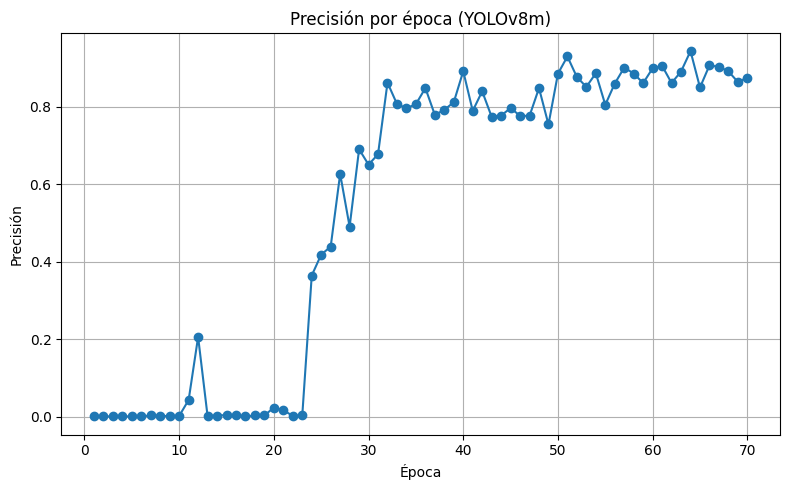

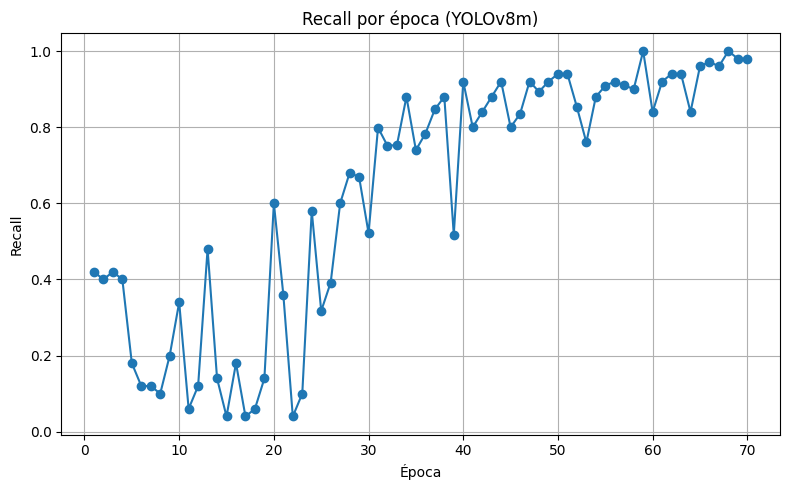

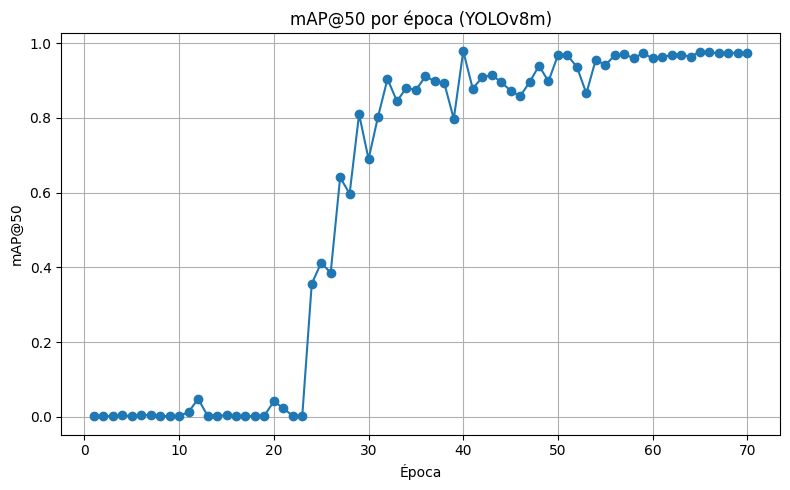

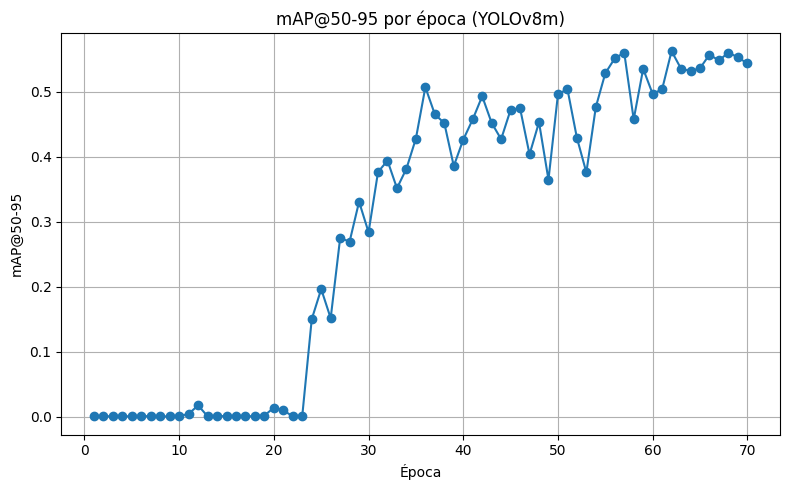

In [ ]:
df = pd.read_csv("comparativa_yolo/yolov8m/results.csv")

# Función para graficar cualquier métrica
def graficar(df, columna, ylabel, titulo, nombre_archivo):
    plt.figure(figsize=(8, 5))
    plt.plot(df['epoch'], df[columna], marker='o', linestyle='-')
    plt.title(titulo)
    plt.xlabel("Época")
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"comparativa_yolo/yolov8m/{nombre_archivo}.png")
    plt.show()

# Graficar cada métrica importante
graficar(df, 'metrics/precision(B)', 'Precisión', 'Precisión por época (YOLOv8m)', 'precision_yolov8m')
graficar(df, 'metrics/recall(B)', 'Recall', 'Recall por época (YOLOv8m)', 'recall_yolov8m')
graficar(df, 'metrics/mAP50(B)', 'mAP@50', 'mAP@50 por época (YOLOv8m)', 'mAP50_yolov8m')
graficar(df, 'metrics/mAP50-95(B)', 'mAP@50-95', 'mAP@50-95 por época (YOLOv8m)', 'mAP50_95_yolov8m')


### CALCULAR TIEMPO DE INFERENCIA MODELO YOLOv8m

In [ ]:
# Cargar el modelo entrenado
yolo_v8m = YOLO("comparativa_yolo/yolov8m/weights/best.pt")

# Ruta al directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([
    os.path.join(test_dir, f)
    for f in os.listdir(test_dir)
    if f.endswith(".png") or f.endswith(".jpg")
])


N = 1

times = []

for image_path in image_files:
    for _ in range(N):
        start = time.time()
        _ = yolo_v8m.predict(source=image_path, conf=0.4, verbose=False)
        end = time.time()
        times.append(end - start)

# Calcular estadísticas
avg_time = sum(times) / len(times)
fps = 1 / avg_time

print(f"🕒 Tiempo promedio por imagen: {avg_time:.4f} segundos")
print(f"⚡ Velocidad estimada: {fps:.2f} FPS")
print(f"📁 Número total de imágenes procesadas: {len(image_files)}")


🕒 Tiempo promedio por imagen: 0.0441 segundos
⚡ Velocidad estimada: 22.66 FPS
📁 Número total de imágenes procesadas: 26


### EVALUAR MODELO YOLOv8m EN TEST

In [ ]:
# Cargar el modelo entrenado
yolo_v8m = YOLO("comparativa_yolo/yolov8m/weights/best.pt")

# Evaluar rendimiento en test
metrics_yolo_v8m = yolo_v8m.val(data="dataset_protesis/data_protesis.yaml", split="test")

# Mostrar métricas relevantes
print(f"mAP@0.5: {metrics_yolo_v8m.box.map50:.3f}")
print(f"mAP@0.5:0.95: {metrics_yolo_v8m.box.map:.3f}")
print(f"Precisión: {metrics_yolo_v8m.box.mp:.3f}")
print(f"Recall: {metrics_yolo_v8m.box.mr:.3f}")


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3463.1±681.9 MB/s, size: 331.7 KB)


val: Scanning /content/dataset_protesis/labels/test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.21it/s]


                   all         26         26      0.997      0.962      0.992      0.537
Speed: 0.4ms preprocess, 27.9ms inference, 0.0ms loss, 3.6ms postprocess per image
Results saved to runs/detect/val3
mAP@0.5: 0.992
mAP@0.5:0.95: 0.537
Precisión: 0.997
Recall: 0.962


### VISUALIZAR RESULTADOS MODELO YOLOv8m


image 1/1 /content/dataset_protesis/images/test/rgb_10.png: 480x640 1 protesis, 28.8ms
Speed: 1.8ms preprocess, 28.8ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


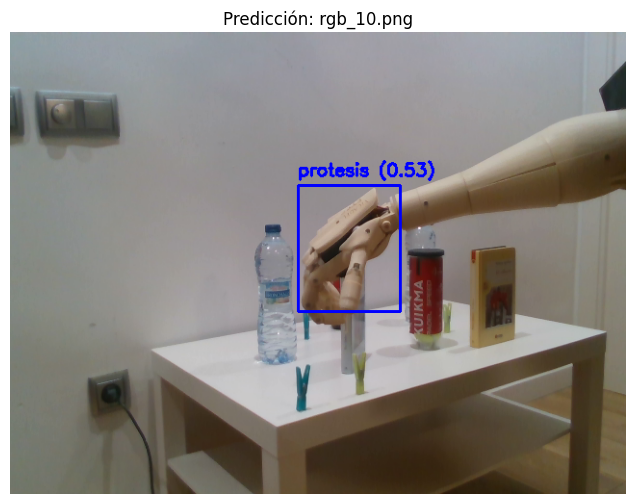


image 1/1 /content/dataset_protesis/images/test/rgb_100.png: 480x640 1 protesis, 28.0ms
Speed: 3.2ms preprocess, 28.0ms inference, 3.5ms postprocess per image at shape (1, 3, 480, 640)


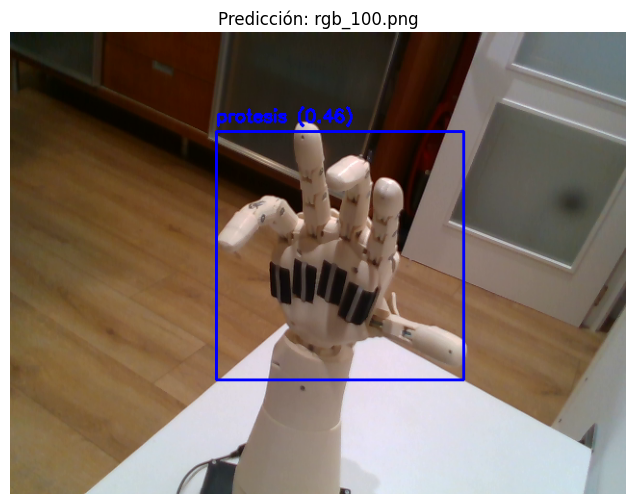


image 1/1 /content/dataset_protesis/images/test/rgb_102.png: 480x640 1 protesis, 28.0ms
Speed: 2.2ms preprocess, 28.0ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


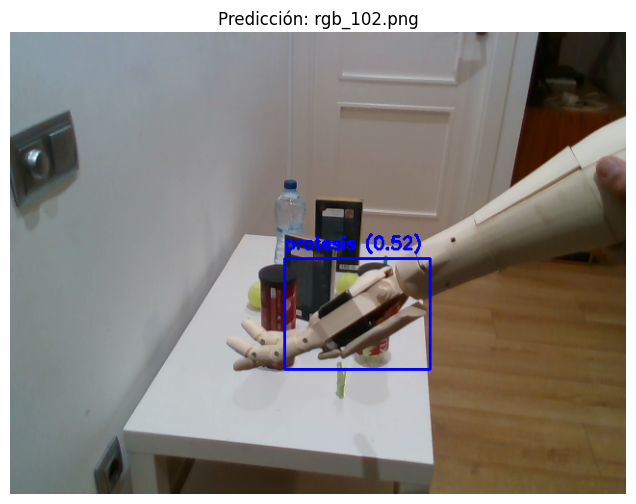


image 1/1 /content/dataset_protesis/images/test/rgb_103.png: 480x640 1 protesis, 28.0ms
Speed: 2.3ms preprocess, 28.0ms inference, 2.2ms postprocess per image at shape (1, 3, 480, 640)


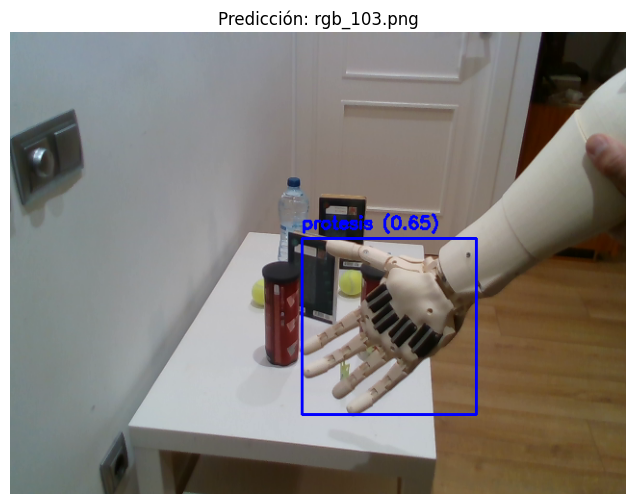


image 1/1 /content/dataset_protesis/images/test/rgb_107.png: 480x640 1 protesis, 28.1ms
Speed: 2.4ms preprocess, 28.1ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


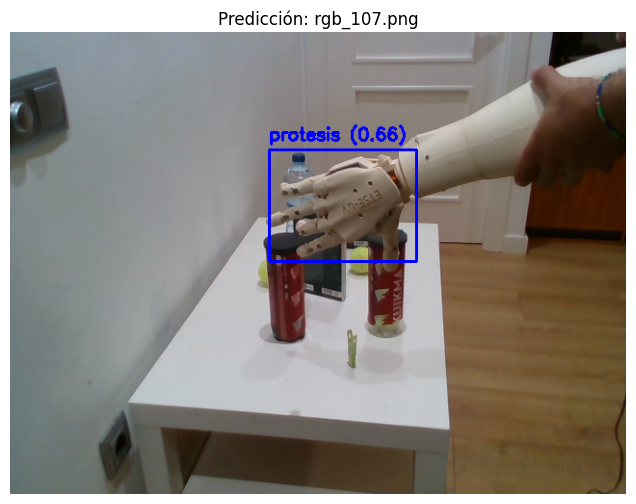


image 1/1 /content/dataset_protesis/images/test/rgb_108.png: 480x640 (no detections), 28.1ms
Speed: 2.6ms preprocess, 28.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


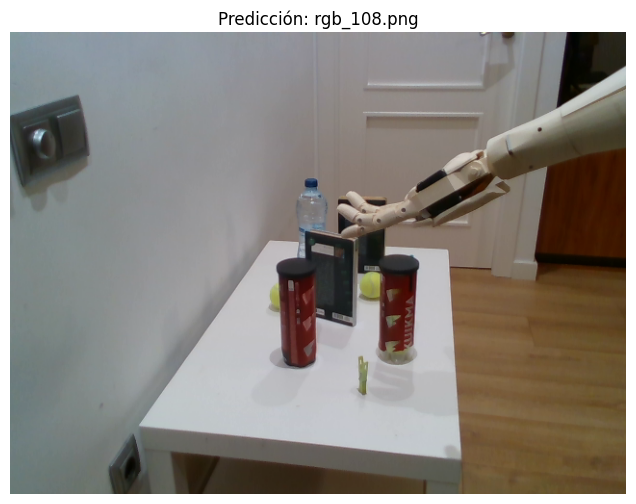


image 1/1 /content/dataset_protesis/images/test/rgb_113.png: 480x640 1 protesis, 28.2ms
Speed: 3.1ms preprocess, 28.2ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


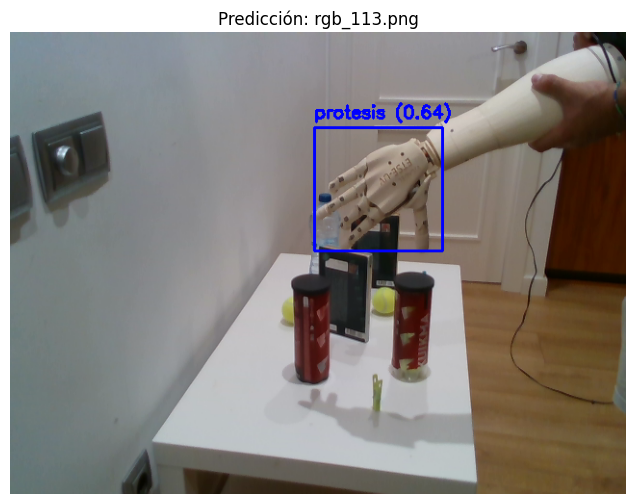


image 1/1 /content/dataset_protesis/images/test/rgb_123.png: 480x640 (no detections), 28.1ms
Speed: 2.6ms preprocess, 28.1ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


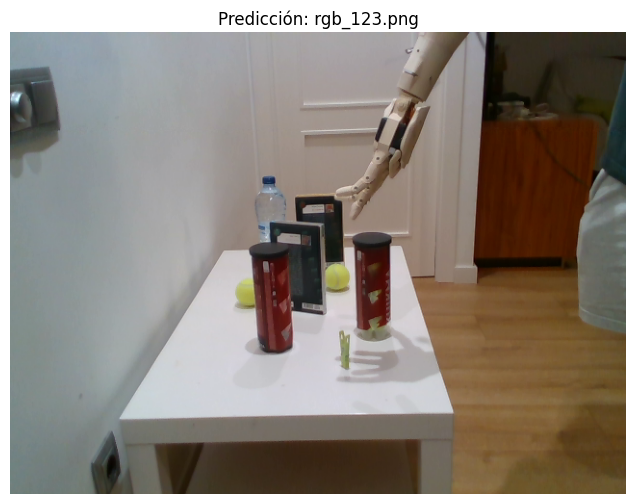


image 1/1 /content/dataset_protesis/images/test/rgb_124.png: 480x640 1 protesis, 28.0ms
Speed: 4.0ms preprocess, 28.0ms inference, 2.0ms postprocess per image at shape (1, 3, 480, 640)


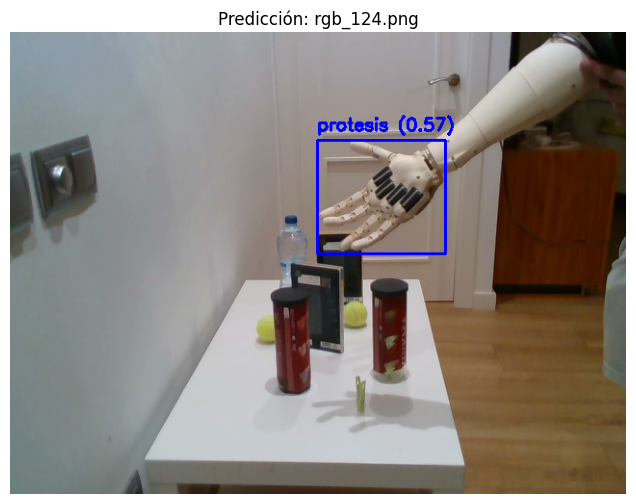

In [ ]:
# Definir colores para cada clase (en BGR para OpenCV)
class_colors = {
    0: (255, 0, 0),    # protesis - azul
}

# Nombres de las clases
class_names = ["protesis"]

# Directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([f for f in os.listdir(test_dir) if f.endswith(".png") or f.endswith(".jpg")])


for file in image_files[:9]:
    path = os.path.join(test_dir, file)
    results = yolo_v8m(path, conf=0.4)[0]

    image = cv2.imread(path)

    for box in results.boxes:
        cls = int(box.cls[0].item())
        conf = box.conf[0].item()
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        color = class_colors.get(cls, (255, 255, 255))
        label = f"{class_names[cls]} ({conf:.2f})"

        # Dibujar caja y texto
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    # Mostrar con matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"Predicción: {file}")
    plt.show()



# MODELO YOLOv8l

### ENTRENAMIENTO YOLOv8l

In [ ]:
yolo_v8l = YOLO("yolov8l.yaml")

yolo_v8l.train(
    data="dataset_protesis/data_protesis.yaml",
    epochs=70,
    imgsz=640,
    batch=16,
    project="comparativa_yolo",
    name="yolov8l",
    exist_ok=True
)


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset_protesis/data_protesis.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=70, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8l, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, 

train: Scanning /content/dataset_protesis/labels/train.cache... 175 images, 0 backgrounds, 0 corrupt: 100%|██████████| 175/175 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 835.2±375.1 MB/s, size: 333.2 KB)


val: Scanning /content/dataset_protesis/labels/val.cache... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<?, ?it/s]


Plotting labels to comparativa_yolo/yolov8l/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to comparativa_yolo/yolov8l
Starting training for 70 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/70      9.35G      3.107      4.854      4.236         26        640: 100%|██████████| 11/11 [00:09<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.65it/s]

                   all         50         50     0.0014        0.4     0.0013   0.000469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/70      10.3G      3.061      4.166      4.123         24        640: 100%|██████████| 11/11 [00:09<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         50    0.00138        0.4    0.00151    0.00055



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/70      9.94G      2.918      3.681      3.885         28        640: 100%|██████████| 11/11 [00:09<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         50         50    0.00137        0.4    0.00143    0.00048



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/70        10G      2.795      3.284      3.598         26        640: 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50    0.00149       0.42    0.00224   0.000538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/70      9.96G       2.79      3.212      3.514         24        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         50    0.00208       0.36    0.00147   0.000348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/70      10.1G      2.774      3.164      3.388         25        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         50    0.00165       0.08    0.00136   0.000292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/70      10.3G      2.773      3.074      3.298         36        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         50         50    0.00196       0.16    0.00209   0.000416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/70       9.9G       2.77      3.175      3.402         33        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         50    0.00504       0.44     0.0148    0.00564



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/70        10G      2.704      2.954      3.277         33        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         50         50    0.00258       0.02    0.00428    0.00129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/70      9.98G      2.613      2.727      3.168         27        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.60it/s]

                   all         50         50      0.166       0.16     0.0798     0.0159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/70       9.9G      2.523      2.567      3.089         32        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.31it/s]

                   all         50         50      0.127       0.22     0.0799     0.0171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/70      10.1G      2.515      2.424      3.043         33        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.90it/s]

                   all         50         50     0.0641       0.02    0.00268   0.000944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/70      10.1G      2.491      2.359      3.024         26        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         50   0.000876       0.04   0.000466   4.66e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/70      9.87G       2.38      2.271      2.968         28        640: 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         50          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/70      9.89G       2.44      2.232      3.114         34        640: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         50         50          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/70      9.97G      2.455      2.193      3.053         35        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]

                   all         50         50          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/70      10.3G      2.461      2.055      2.994         36        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         50    0.00285       0.02   0.000923   0.000395



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/70      9.96G      2.384      1.954      2.954         35        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         50          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/70      9.89G       2.34      1.871      2.959         31        640: 100%|██████████| 11/11 [00:08<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         50         50    0.00325       0.08    0.00412    0.00109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/70      10.1G      2.242       1.88      2.899         28        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         50     0.0169        0.3     0.0311    0.00627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/70      10.4G      2.183      1.796      2.793         25        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         50         50      0.044       0.42      0.153     0.0419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/70      9.97G      2.214      1.737      2.864         36        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]

                   all         50         50      0.101        0.3     0.0464     0.0175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/70      9.89G      2.318       1.84      2.881         27        640: 100%|██████████| 11/11 [00:08<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all         50         50      0.288       0.38      0.265      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/70        10G      2.148      1.702      2.804         34        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         50         50      0.455       0.36       0.34      0.097



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/70      10.5G      2.167      1.643      2.754         29        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         50      0.582       0.48      0.428      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/70      9.98G      2.166      1.587      2.758         33        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.82it/s]

                   all         50         50     0.0725       0.16     0.0599     0.0217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/70      9.95G      2.043      1.567        2.7         26        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         50      0.491       0.42        0.5      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/70        10G      2.123       1.47      2.706         24        640: 100%|██████████| 11/11 [00:09<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         50       0.51       0.66      0.583      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/70      10.3G      2.118      1.488      2.699         31        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         50      0.708       0.46      0.609      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/70       9.9G      2.055      1.525      2.688         32        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50        0.5       0.46       0.53      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/70      9.96G      2.027      1.497      2.719         29        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         50      0.611      0.816      0.756      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/70      9.95G      1.991      1.498      2.693         39        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50      0.418      0.619       0.54      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/70      10.1G      2.127      1.482      2.732         27        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.35it/s]

                   all         50         50      0.489       0.22      0.329      0.141



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/70      9.88G      2.138      1.445      2.696         34        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]

                   all         50         50      0.737       0.54      0.716      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/70      9.97G      2.037       1.37      2.631         23        640: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]

                   all         50         50      0.417       0.36      0.421      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/70      10.1G      1.967      1.395      2.641         23        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50      0.745       0.84      0.839      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/70      10.3G      1.845      1.372      2.514         29        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         50      0.691       0.56      0.681      0.272



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/70      9.87G      1.979      1.346      2.552         26        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50      0.741       0.72      0.855      0.446



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/70      9.89G      1.857      1.224      2.445         33        640: 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         50       0.69       0.84      0.842      0.436



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/70        10G      1.855      1.209      2.476         32        640: 100%|██████████| 11/11 [00:08<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         50      0.816        0.9      0.921      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/70      10.4G      1.876      1.274      2.488         28        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         50         50      0.843      0.752      0.846      0.344



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/70      9.88G      1.897       1.28      2.503         25        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50      0.713       0.62       0.75      0.327



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/70      9.96G      1.785      1.279      2.446         34        640: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.83it/s]

                   all         50         50      0.829      0.873      0.927      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/70      10.1G       1.84       1.23      2.485         26        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         50      0.888        0.9      0.968      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/70      10.1G      1.822      1.137      2.466         21        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         50         50      0.919       0.96      0.945      0.431



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/70      9.98G      1.812      1.173      2.436         28        640: 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.33it/s]

                   all         50         50      0.822      0.833      0.921      0.507



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/70      9.86G      1.748       1.23       2.44         36        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50       0.94        0.9      0.973      0.502



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/70      10.1G      1.779       1.19      2.424         24        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         50      0.825       0.74      0.852      0.389



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/70      10.3G      1.801      1.165      2.428         34        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.34it/s]

                   all         50         50      0.772      0.879      0.908      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/70      9.91G       1.76      1.105      2.466         30        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.08it/s]

                   all         50         50      0.869       0.88      0.964      0.486



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      51/70      9.97G      1.737      1.114      2.353         30        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         50         50      0.858      0.849      0.948      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      52/70        10G      1.703       1.14      2.331         24        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         50         50       0.96      0.949      0.985      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      53/70      10.5G      1.717      1.121      2.324         35        640: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.86it/s]

                   all         50         50      0.902       0.92      0.943      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      54/70      9.91G      1.703      1.107      2.369         28        640: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]

                   all         50         50      0.832        0.9      0.935      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      55/70      9.84G      1.612      1.073      2.263         36        640: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         50         50       0.75      0.842      0.925       0.51



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      56/70        10G      1.573      1.032      2.259         32        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.32it/s]

                   all         50         50      0.959      0.932      0.977      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      57/70        10G      1.657      1.038      2.315         23        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.29it/s]

                   all         50         50      0.956       0.92      0.977      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      58/70      9.87G      1.599      1.003      2.252         30        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]

                   all         50         50       0.87       0.94      0.963      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      59/70      9.95G       1.64      1.044      2.327         23        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]

                   all         50         50       0.85        0.9       0.96      0.519



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      60/70      10.1G       1.65       1.03      2.285         25        640: 100%|██████████| 11/11 [00:08<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.02it/s]

                   all         50         50      0.931        0.9       0.98      0.507


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      61/70      10.1G      1.501      1.085      2.341         15        640: 100%|██████████| 11/11 [00:09<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.98it/s]

                   all         50         50      0.959      0.926      0.969      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      62/70      9.88G      1.515      1.006      2.295         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.81it/s]

                   all         50         50       0.98      0.956      0.984      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      63/70      9.86G      1.444      0.958      2.224         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         50      0.898       0.88      0.967      0.521



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      64/70      10.1G      1.478     0.9501      2.284         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         50      0.906       0.94      0.954      0.542



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      65/70      10.5G      1.364     0.9359      2.139         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         50         50      0.915       0.94      0.974      0.537



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      66/70      9.97G      1.333     0.9123      2.118         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         50      0.958      0.915      0.984      0.551



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      67/70      9.86G      1.406     0.8794      2.209         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         50         50      0.968       0.96      0.992      0.527



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      68/70      10.1G      1.322     0.8155      2.109         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         50       0.98      0.973      0.991      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      69/70      10.1G      1.261     0.8311      2.036         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         50      0.959      0.941       0.99       0.56



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      70/70      9.97G      1.338      0.823      2.094         15        640: 100%|██████████| 11/11 [00:08<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         50         50      0.978       0.92      0.986      0.558



70 epochs completed in 0.285 hours.
Optimizer stripped from comparativa_yolo/yolov8l/weights/last.pt, 87.6MB
Optimizer stripped from comparativa_yolo/yolov8l/weights/best.pt, 87.6MB

Validating comparativa_yolo/yolov8l/weights/best.pt...
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8l summary (fused): 112 layers, 43,607,379 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.84it/s]


                   all         50         50      0.959      0.942       0.99      0.561
Speed: 0.2ms preprocess, 14.5ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to comparativa_yolo/yolov8l


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f914a63f90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### GRAFICAR MÉTRICAS YOLOv8l

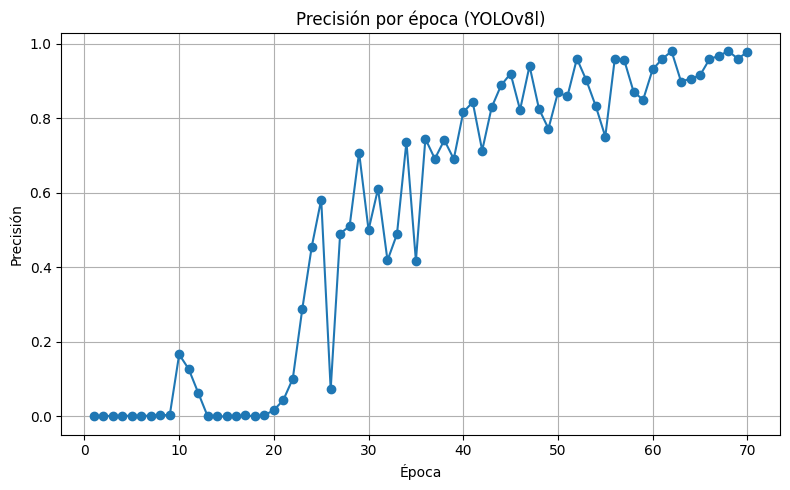

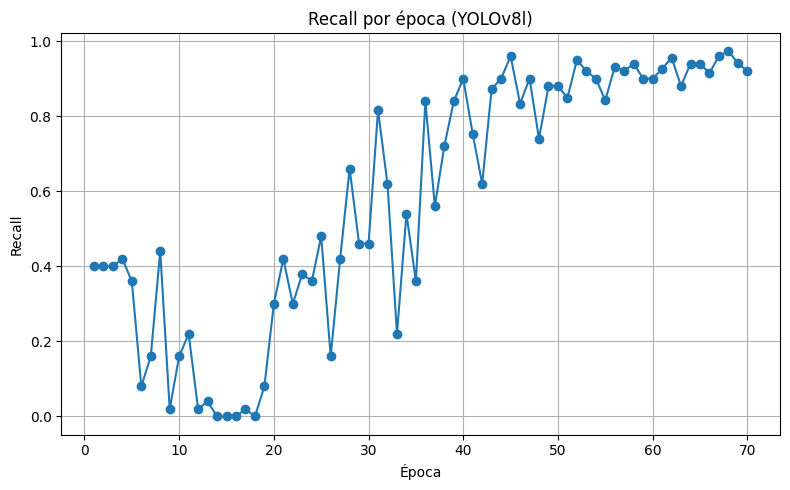

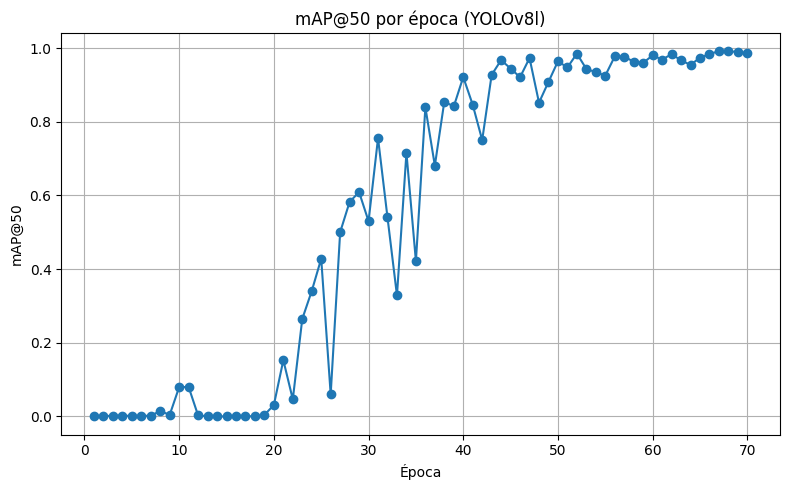

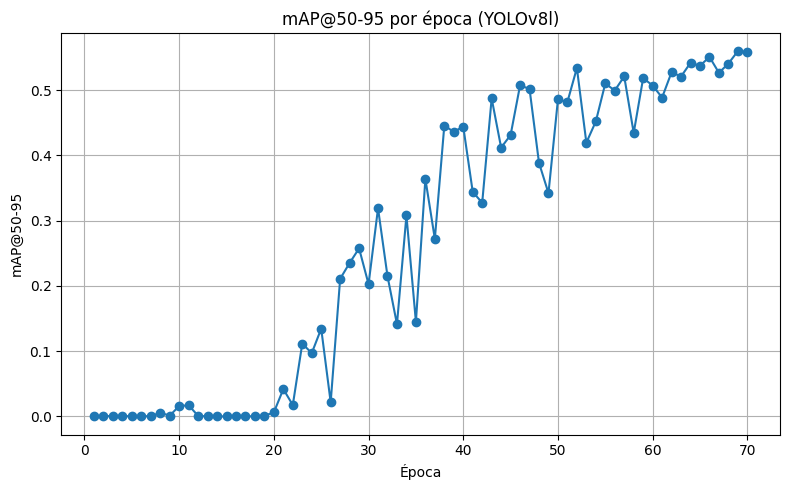

In [ ]:
df = pd.read_csv("comparativa_yolo/yolov8l/results.csv")

# Función para graficar cualquier métrica
def graficar(df, columna, ylabel, titulo, nombre_archivo):
    plt.figure(figsize=(8, 5))
    plt.plot(df['epoch'], df[columna], marker='o', linestyle='-')
    plt.title(titulo)
    plt.xlabel("Época")
    plt.ylabel(ylabel)
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(f"comparativa_yolo/yolov8l/{nombre_archivo}.png")
    plt.show()

# Graficar cada métrica importante
graficar(df, 'metrics/precision(B)', 'Precisión', 'Precisión por época (YOLOv8l)', 'precision_yolov8l')
graficar(df, 'metrics/recall(B)', 'Recall', 'Recall por época (YOLOv8l)', 'recall_yolov8l')
graficar(df, 'metrics/mAP50(B)', 'mAP@50', 'mAP@50 por época (YOLOv8l)', 'mAP50_yolov8l')
graficar(df, 'metrics/mAP50-95(B)', 'mAP@50-95', 'mAP@50-95 por época (YOLOv8l)', 'mAP50_95_yolov8l')


### CALCULAR TIEMPO DE INFERENCIA MODELO YOLOv8l

In [ ]:
# Cargar el modelo entrenado
yolo_v8l = YOLO("comparativa_yolo/yolov8l/weights/best.pt")

# Ruta al directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([
    os.path.join(test_dir, f)
    for f in os.listdir(test_dir)
    if f.endswith(".png") or f.endswith(".jpg")
])

N = 1

times = []

for image_path in image_files:
    for _ in range(N):
        start = time.time()
        _ = yolo_v8l.predict(source=image_path, conf=0.4, verbose=False)
        end = time.time()
        times.append(end - start)

# Calcular estadísticas
avg_time = sum(times) / len(times)
fps = 1 / avg_time

print(f"🕒 Tiempo promedio por imagen: {avg_time:.4f} segundos")
print(f"⚡ Velocidad estimada: {fps:.2f} FPS")
print(f"📁 Número total de imágenes procesadas: {len(image_files)}")


🕒 Tiempo promedio por imagen: 0.0643 segundos
⚡ Velocidad estimada: 15.54 FPS
📁 Número total de imágenes procesadas: 26


### EVALUAR MODELO YOLOv8l EN TEST

In [ ]:
# Cargar el modelo entrenado
yolo_v8l = YOLO("comparativa_yolo/yolov8l/weights/best.pt")

# Evaluar rendimiento en test
metrics_yolo_v8l = yolo_v8l.val(data="dataset_protesis/data_protesis.yaml", split="test")

# Mostrar métricas relevantes
print(f"mAP@0.5: {metrics_yolo_v8l.box.map50:.3f}")
print(f"mAP@0.5:0.95: {metrics_yolo_v8l.box.map:.3f}")
print(f"Precisión: {metrics_yolo_v8l.box.mp:.3f}")
print(f"Recall: {metrics_yolo_v8l.box.mr:.3f}")


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8l summary (fused): 112 layers, 43,607,379 parameters, 0 gradients, 164.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4146.9±1085.6 MB/s, size: 331.7 KB)


val: Scanning /content/dataset_protesis/labels/test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.36it/s]


                   all         26         26      0.955      0.923      0.988      0.513
Speed: 0.3ms preprocess, 35.0ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/detect/val4
mAP@0.5: 0.988
mAP@0.5:0.95: 0.513
Precisión: 0.955
Recall: 0.923


### VISUALIZAR RESULTADOS MODELO YOLOv8l


image 1/1 /content/dataset_protesis/images/test/rgb_10.png: 480x640 1 protesis, 52.8ms
Speed: 1.8ms preprocess, 52.8ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


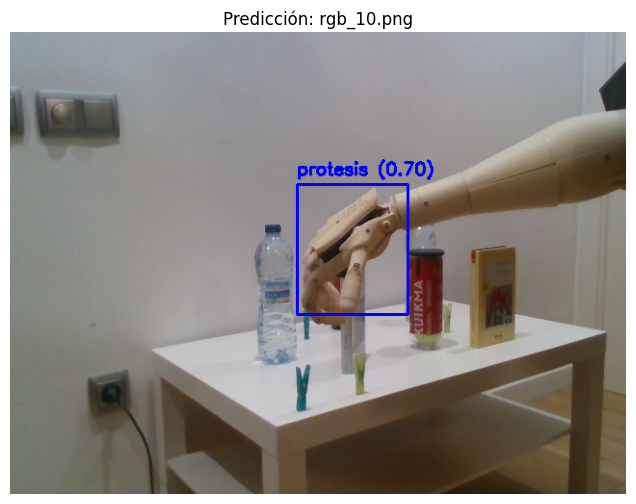


image 1/1 /content/dataset_protesis/images/test/rgb_100.png: 480x640 1 protesis, 49.3ms
Speed: 8.2ms preprocess, 49.3ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


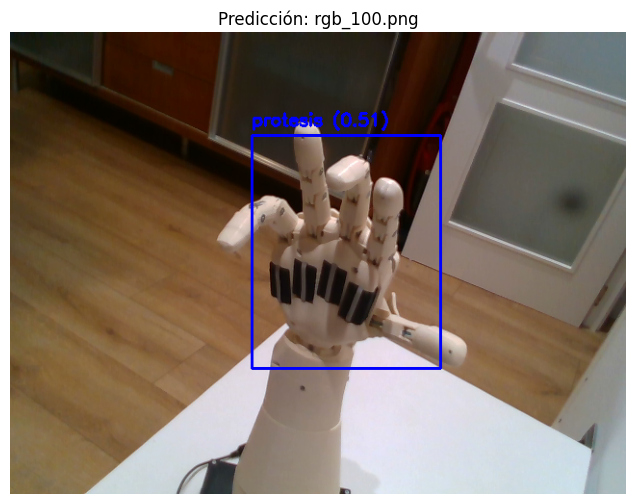


image 1/1 /content/dataset_protesis/images/test/rgb_102.png: 480x640 1 protesis, 49.2ms
Speed: 2.5ms preprocess, 49.2ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


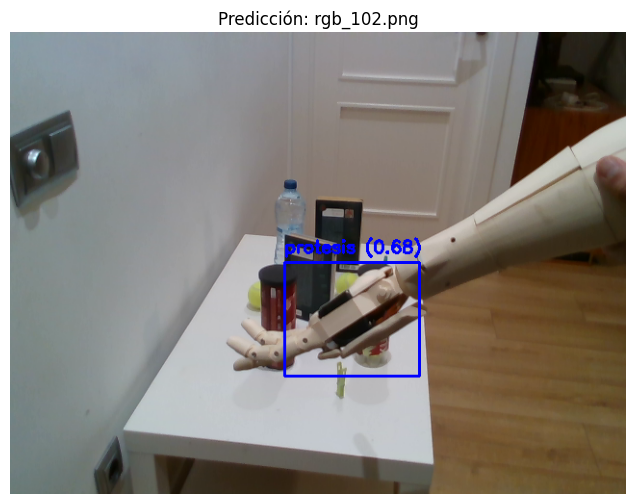


image 1/1 /content/dataset_protesis/images/test/rgb_103.png: 480x640 1 protesis, 49.2ms
Speed: 4.3ms preprocess, 49.2ms inference, 2.7ms postprocess per image at shape (1, 3, 480, 640)


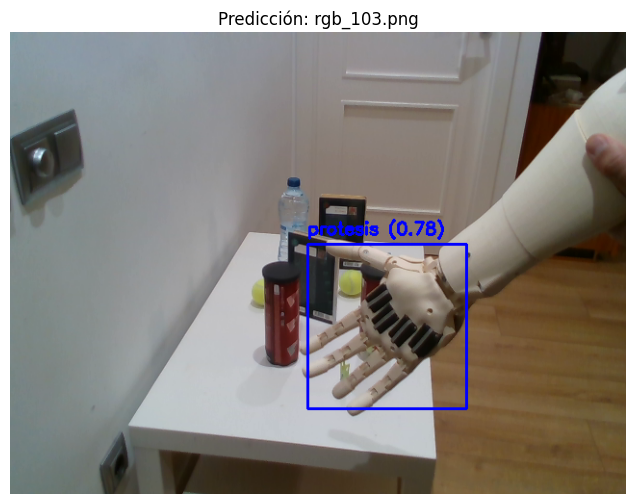


image 1/1 /content/dataset_protesis/images/test/rgb_107.png: 480x640 1 protesis, 49.2ms
Speed: 2.5ms preprocess, 49.2ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


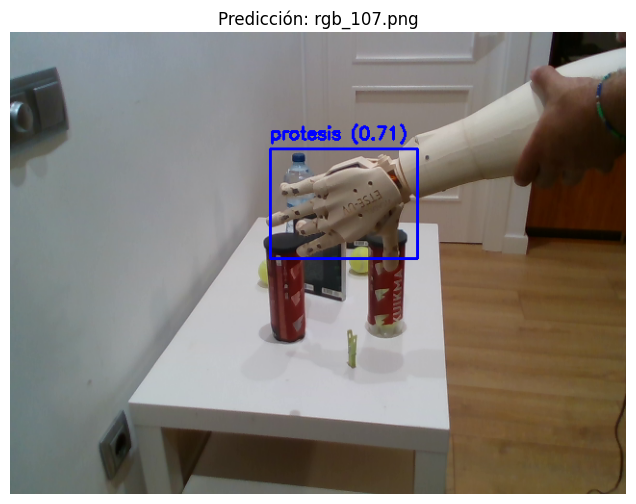


image 1/1 /content/dataset_protesis/images/test/rgb_108.png: 480x640 1 protesis, 51.4ms
Speed: 2.0ms preprocess, 51.4ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


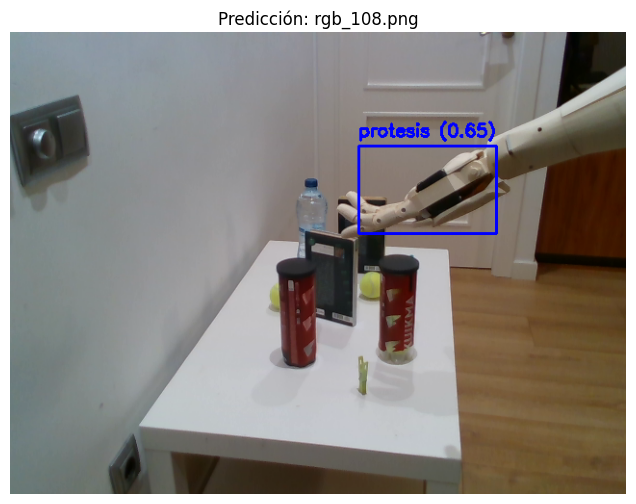


image 1/1 /content/dataset_protesis/images/test/rgb_113.png: 480x640 1 protesis, 51.7ms
Speed: 2.2ms preprocess, 51.7ms inference, 2.3ms postprocess per image at shape (1, 3, 480, 640)


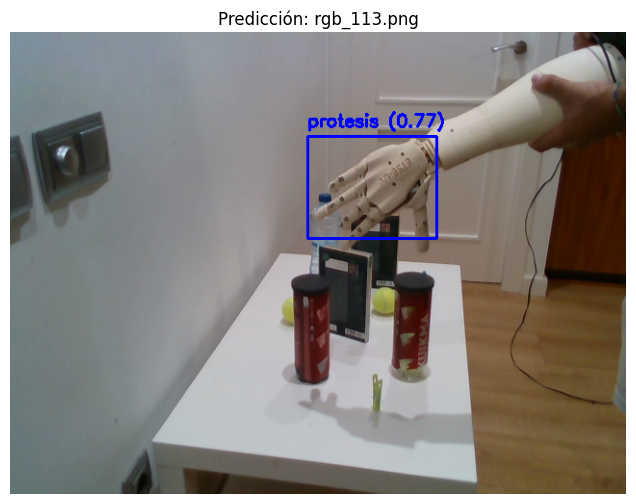


image 1/1 /content/dataset_protesis/images/test/rgb_123.png: 480x640 2 protesiss, 51.4ms
Speed: 2.2ms preprocess, 51.4ms inference, 2.6ms postprocess per image at shape (1, 3, 480, 640)


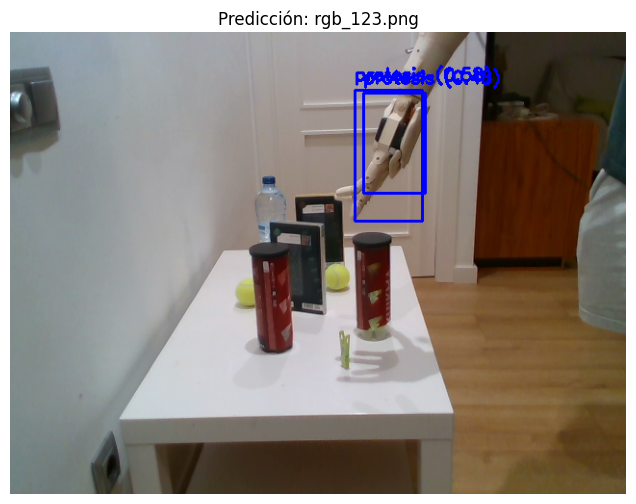


image 1/1 /content/dataset_protesis/images/test/rgb_124.png: 480x640 1 protesis, 51.4ms
Speed: 2.4ms preprocess, 51.4ms inference, 2.1ms postprocess per image at shape (1, 3, 480, 640)


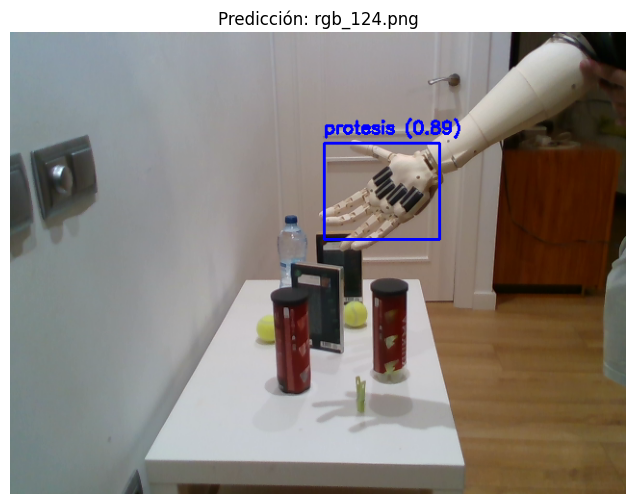

In [ ]:
# Definir colores para cada clase (en BGR para OpenCV)
class_colors = {
    0: (255, 0, 0),    # protesis - azul
}

# Nombres de las clases
class_names = ["protesis"]

# Directorio de imágenes de test
test_dir = "dataset_protesis/images/test"
image_files = sorted([f for f in os.listdir(test_dir) if f.endswith(".png") or f.endswith(".jpg")])

# Mostrar algunas imágenes con bounding boxes
for file in image_files[:9]:
    path = os.path.join(test_dir, file)
    results = yolo_v8l(path, conf=0.4)[0]

    image = cv2.imread(path)

    for box in results.boxes:
        cls = int(box.cls[0].item())
        conf = box.conf[0].item()
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        color = class_colors.get(cls, (255, 255, 255))
        label = f"{class_names[cls]} ({conf:.2f})"

        # Dibujar caja y texto
        cv2.rectangle(image, (x1, y1), (x2, y2), color, 2)
        cv2.putText(image, label, (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

    # Mostrar con matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(10, 6))
    plt.imshow(image_rgb)
    plt.axis('off')
    plt.title(f"Predicción: {file}")
    plt.show()


# Comparación Modelos YOLO


In [ ]:
from ultralytics import YOLO
import pandas as pd
import os
import time

# Definir los modelos y sus rutas
modelos = {
    "YOLOv8n": "comparativa_yolo/yolov8n/weights/best.pt",
    "YOLOv8s": "comparativa_yolo/yolov8s/weights/best.pt",
    "YOLOv8m": "comparativa_yolo/yolov8m/weights/best.pt",
    "YOLOv8l": "comparativa_yolo/yolov8l/weights/best.pt"
}

# Obtener la lista de imágenes de test
test_dir = "dataset_protesis/images/test"
imagenes_test = sorted([
    os.path.join(test_dir, f)
    for f in os.listdir(test_dir)
    if f.lower().endswith((".png", ".jpg", ".jpeg"))
])

# Lista para almacenar los resultados
resultados = []

# Evaluar cada modelo
for nombre, ruta in modelos.items():
    model = YOLO(ruta)
    metrics = model.val(data="dataset_protesis/data_protesis.yaml", split="test")

    # Medir el tiempo total para todas las imágenes
    tiempos = []
    for img in imagenes_test:
        start = time.time()
        _ = model.predict(source=img, conf=0.4, verbose=False)
        tiempos.append(time.time() - start)

    tiempo_medio = sum(tiempos) / len(tiempos)
    fps = 1 / tiempo_medio

    resultados.append({
        "Modelo": nombre,
        "Precisión media (mp)": metrics.box.mp,
        "Recall medio (mr)": metrics.box.mr,
        "mAP@0.5": metrics.box.map50,
        "mAP@0.5:0.95": metrics.box.map,
        "Velocidad (FPS)": fps
    })

# Crear el DataFrame con los resultados
df_resultados = pd.DataFrame(resultados)
df_resultados.to_csv("comparativa_modelos_yolo.csv", index=False)

print("✅ Comparativa guardada en 'comparativa_modelos_yolo.csv'")
df_resultados


Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n summary (fused): 72 layers, 3,005,843 parameters, 0 gradients, 8.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4077.8±1290.0 MB/s, size: 338.2 KB)


val: Scanning /content/dataset_protesis/labels/test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]


                   all         26         26      0.814      0.885      0.942      0.538
Speed: 9.1ms preprocess, 4.0ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to runs/detect/val5
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8s summary (fused): 72 layers, 11,125,971 parameters, 0 gradients, 28.4 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3964.8±1344.3 MB/s, size: 347.3 KB)


val: Scanning /content/dataset_protesis/labels/test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]


                   all         26         26      0.911      0.783      0.939      0.563
Speed: 9.7ms preprocess, 8.9ms inference, 0.0ms loss, 2.1ms postprocess per image
Results saved to runs/detect/val6
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8m summary (fused): 92 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3056.7±518.1 MB/s, size: 319.7 KB)


val: Scanning /content/dataset_protesis/labels/test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.40it/s]


                   all         26         26      0.997      0.962      0.992      0.537
Speed: 5.5ms preprocess, 18.0ms inference, 0.0ms loss, 3.7ms postprocess per image
Results saved to runs/detect/val7
Ultralytics 8.3.166 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8l summary (fused): 112 layers, 43,607,379 parameters, 0 gradients, 164.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 4384.0±1066.7 MB/s, size: 335.0 KB)


val: Scanning /content/dataset_protesis/labels/test.cache... 26 images, 0 backgrounds, 0 corrupt: 100%|██████████| 26/26 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]


                   all         26         26      0.955      0.923      0.988      0.513
Speed: 0.2ms preprocess, 29.7ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to runs/detect/val8
✅ Comparativa guardada en 'comparativa_modelos_yolo.csv'


,Modelo,Precisión media (mp),Recall medio (mr),mAP@0.5,mAP@0.5:0.95,Velocidad (FPS)
0,YOLOv8n,0.814016,0.884615,0.942286,0.538020,57.267520
1,YOLOv8s,0.910512,0.783058,0.938933,0.562622,43.826307
2,YOLOv8m,0.997497,0.961538,0.991897,0.537320,33.101773
3,YOLOv8l,0.955174,0.923077,0.987759,0.512932,21.748012
